# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = [False, False],
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2,
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1, 
                method = "mse_z", 
                latent_group = "unreserved",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    encode_covariates=False,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=['zone', 'time_cat'],
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "afriat_v1_1_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

/tmp/ipykernel_2239956/3442977401.py:51: UserWarning: `(None, ['zone', 'time_cat'])` is defined as `batch_key` or `categorical_covariate`, it will be given to both encoder and decoder. Make sure this does not contain information of any of your disentenglement targets. For example, if `donor_id` is chosen as a batch key, do not disentengle donor level information such as `sex` or `age`. The decoder should not use the disentengled latent spaces, simply ignores, if it is already given a batch_key. 
  tardis.MyModel.setup_anndata(adata, **dataset_params)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: zw8cuow6
Name: legendary-transport-115
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/zw8cuow6
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_155910-zw8cuow6/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2572,3280,9391
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 633,829,2348
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:09<1:34:35,  9.47s/it]

Epoch 1/600:   0%|          | 1/600 [00:09<1:34:35,  9.47s/it, v_num=w6_1, total_loss_train=3.69e+3, kl_local_train=44.6]

Epoch 2/600:   0%|          | 1/600 [00:09<1:34:35,  9.47s/it, v_num=w6_1, total_loss_train=3.69e+3, kl_local_train=44.6]

Epoch 2/600:   0%|          | 2/600 [00:18<1:29:03,  8.94s/it, v_num=w6_1, total_loss_train=3.69e+3, kl_local_train=44.6]

Epoch 2/600:   0%|          | 2/600 [00:18<1:29:03,  8.94s/it, v_num=w6_1, total_loss_train=3.22e+3, kl_local_train=67.8]

Epoch 3/600:   0%|          | 2/600 [00:18<1:29:03,  8.94s/it, v_num=w6_1, total_loss_train=3.22e+3, kl_local_train=67.8]

Epoch 3/600:   0%|          | 3/600 [00:26<1:27:11,  8.76s/it, v_num=w6_1, total_loss_train=3.22e+3, kl_local_train=67.8]

Epoch 3/600:   0%|          | 3/600 [00:26<1:27:11,  8.76s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=68.6]

Epoch 4/600:   0%|          | 3/600 [00:26<1:27:11,  8.76s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=68.6]

Epoch 4/600:   1%|          | 4/600 [00:35<1:27:32,  8.81s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=68.6]

Epoch 4/600:   1%|          | 4/600 [00:35<1:27:32,  8.81s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=63]  

Epoch 5/600:   1%|          | 4/600 [00:35<1:27:32,  8.81s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=63]

Epoch 5/600:   1%|          | 5/600 [00:44<1:26:38,  8.74s/it, v_num=w6_1, total_loss_train=3.21e+3, kl_local_train=63]

Epoch 5/600:   1%|          | 5/600 [00:44<1:26:38,  8.74s/it, v_num=w6_1, total_loss_train=3.2e+3, kl_local_train=47.3]

Epoch 6/600:   1%|          | 5/600 [00:45<1:26:38,  8.74s/it, v_num=w6_1, total_loss_train=3.2e+3, kl_local_train=47.3]

Epoch 6/600:   1%|          | 6/600 [00:53<1:27:33,  8.84s/it, v_num=w6_1, total_loss_train=3.2e+3, kl_local_train=47.3]

Epoch 6/600:   1%|          | 6/600 [00:53<1:27:33,  8.84s/it, v_num=w6_1, total_loss_train=3.19e+3, kl_local_train=41.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 6/600 [00:53<1:27:33,  8.84s/it, v_num=w6_1, total_loss_train=3.19e+3, kl_local_train=41.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [01:00<1:24:12,  8.52s/it, v_num=w6_1, total_loss_train=3.19e+3, kl_local_train=41.7, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 7/600:   1%|          | 7/600 [01:00<1:24:12,  8.52s/it, v_num=w6_1, total_loss_train=3.18e+3, kl_local_train=40.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|          | 7/600 [01:00<1:24:12,  8.52s/it, v_num=w6_1, total_loss_train=3.18e+3, kl_local_train=40.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:23:12,  8.43s/it, v_num=w6_1, total_loss_train=3.18e+3, kl_local_train=40.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 8/600:   1%|▏         | 8/600 [01:09<1:23:12,  8.43s/it, v_num=w6_1, total_loss_train=3.16e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 9/600:   1%|▏         | 8/600 [01:09<1:23:12,  8.43s/it, v_num=w6_1, total_loss_train=3.16e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:16<1:20:56,  8.22s/it, v_num=w6_1, total_loss_train=3.16e+3, kl_local_train=48.2, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 9/600:   2%|▏         | 9/600 [01:16<1:20:56,  8.22s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 9/600 [01:16<1:20:56,  8.22s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:21:04,  8.25s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=56.9, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 10/600:   2%|▏         | 10/600 [01:25<1:21:04,  8.25s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=63.3, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 10/600 [01:26<1:21:04,  8.25s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=63.3, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [01:33<1:22:17,  8.38s/it, v_num=w6_1, total_loss_train=3.15e+3, kl_local_train=63.3, metric_mi|status_control_train=0.0185, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0124, metric_mi|mouse_train=0.0352]

Epoch 11/600:   2%|▏         | 11/600 [01:33<1:22:17,  8.38s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 12/600:   2%|▏         | 11/600 [01:33<1:22:17,  8.38s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:21:07,  8.28s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=70.1, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 12/600:   2%|▏         | 12/600 [01:42<1:21:07,  8.28s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=82.2, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 13/600:   2%|▏         | 12/600 [01:42<1:21:07,  8.28s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=82.2, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 13/600:   2%|▏         | 13/600 [01:49<1:19:31,  8.13s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=82.2, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 13/600:   2%|▏         | 13/600 [01:49<1:19:31,  8.13s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=101, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829] 

Epoch 14/600:   2%|▏         | 13/600 [01:49<1:19:31,  8.13s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=101, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:18:53,  8.08s/it, v_num=w6_1, total_loss_train=3.14e+3, kl_local_train=101, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 14/600:   2%|▏         | 14/600 [01:57<1:18:53,  8.08s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 15/600:   2%|▏         | 14/600 [01:57<1:18:53,  8.08s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:18:38,  8.07s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=132, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 15/600:   2%|▎         | 15/600 [02:05<1:18:38,  8.07s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=171, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 16/600:   2%|▎         | 15/600 [02:06<1:18:38,  8.07s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=171, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 16/600:   3%|▎         | 16/600 [02:14<1:21:17,  8.35s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=171, metric_mi|status_control_train=0.0454, metric_mi|zone_train=0.0787, metric_mi|time_cat_train=0.0529, metric_mi|mouse_train=0.0829]

Epoch 16/600:   3%|▎         | 16/600 [02:14<1:21:17,  8.35s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=209, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 17/600:   3%|▎         | 16/600 [02:14<1:21:17,  8.35s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=209, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 17/600:   3%|▎         | 17/600 [02:22<1:19:20,  8.16s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=209, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 17/600:   3%|▎         | 17/600 [02:22<1:19:20,  8.16s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=200, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 18/600:   3%|▎         | 17/600 [02:22<1:19:20,  8.16s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=200, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 18/600:   3%|▎         | 18/600 [02:30<1:18:25,  8.08s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=200, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 18/600:   3%|▎         | 18/600 [02:30<1:18:25,  8.08s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=173, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 19/600:   3%|▎         | 18/600 [02:30<1:18:25,  8.08s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=173, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 19/600:   3%|▎         | 19/600 [02:38<1:17:48,  8.03s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=173, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 19/600:   3%|▎         | 19/600 [02:38<1:17:48,  8.03s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=157, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 20/600:   3%|▎         | 19/600 [02:38<1:17:48,  8.03s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=157, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 20/600:   3%|▎         | 20/600 [02:46<1:17:33,  8.02s/it, v_num=w6_1, total_loss_train=3.13e+3, kl_local_train=157, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 20/600:   3%|▎         | 20/600 [02:46<1:17:33,  8.02s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=144, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 21/600:   3%|▎         | 20/600 [02:47<1:17:33,  8.02s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=144, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 21/600:   4%|▎         | 21/600 [02:55<1:20:39,  8.36s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=144, metric_mi|status_control_train=0.0624, metric_mi|zone_train=0.0621, metric_mi|time_cat_train=0.0666, metric_mi|mouse_train=0.0986]

Epoch 21/600:   4%|▎         | 21/600 [02:55<1:20:39,  8.36s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=128, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]  

Epoch 22/600:   4%|▎         | 21/600 [02:55<1:20:39,  8.36s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=128, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 22/600:   4%|▎         | 22/600 [03:03<1:18:42,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=128, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 22/600:   4%|▎         | 22/600 [03:03<1:18:42,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 23/600:   4%|▎         | 22/600 [03:03<1:18:42,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 23/600:   4%|▍         | 23/600 [03:11<1:18:31,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=121, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 23/600:   4%|▍         | 23/600 [03:11<1:18:31,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=114, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 24/600:   4%|▍         | 23/600 [03:11<1:18:31,  8.17s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=114, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 24/600:   4%|▍         | 24/600 [03:19<1:17:11,  8.04s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=114, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 24/600:   4%|▍         | 24/600 [03:19<1:17:11,  8.04s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 25/600:   4%|▍         | 24/600 [03:19<1:17:11,  8.04s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 25/600:   4%|▍         | 25/600 [03:27<1:17:10,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 25/600:   4%|▍         | 25/600 [03:27<1:17:10,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 26/600:   4%|▍         | 25/600 [03:28<1:17:10,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 26/600:   4%|▍         | 26/600 [03:35<1:19:02,  8.26s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.105, metric_mi|zone_train=0.0522, metric_mi|time_cat_train=0.0918, metric_mi|mouse_train=0.116]

Epoch 26/600:   4%|▍         | 26/600 [03:35<1:19:02,  8.26s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=100, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12] 

Epoch 27/600:   4%|▍         | 26/600 [03:35<1:19:02,  8.26s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=100, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 27/600:   4%|▍         | 27/600 [03:44<1:18:23,  8.21s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=100, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 27/600:   4%|▍         | 27/600 [03:44<1:18:23,  8.21s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=98.8, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 28/600:   4%|▍         | 27/600 [03:44<1:18:23,  8.21s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=98.8, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 28/600:   5%|▍         | 28/600 [03:51<1:16:49,  8.06s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=98.8, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 28/600:   5%|▍         | 28/600 [03:51<1:16:49,  8.06s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12] 

Epoch 29/600:   5%|▍         | 28/600 [03:51<1:16:49,  8.06s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 29/600:   5%|▍         | 29/600 [03:59<1:15:47,  7.96s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=103, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 29/600:   5%|▍         | 29/600 [03:59<1:15:47,  7.96s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=102, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 30/600:   5%|▍         | 29/600 [03:59<1:15:47,  7.96s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=102, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 30/600:   5%|▌         | 30/600 [04:07<1:16:28,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=102, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 30/600:   5%|▌         | 30/600 [04:07<1:16:28,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 31/600:   5%|▌         | 30/600 [04:08<1:16:28,  8.05s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 31/600:   5%|▌         | 31/600 [04:16<1:18:07,  8.24s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.124, metric_mi|zone_train=0.0468, metric_mi|time_cat_train=0.0956, metric_mi|mouse_train=0.12]

Epoch 31/600:   5%|▌         | 31/600 [04:16<1:18:07,  8.24s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=108, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 31/600 [04:16<1:18:07,  8.24s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=108, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:17:51,  8.22s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=108, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 32/600:   5%|▌         | 32/600 [04:24<1:17:51,  8.22s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 33/600:   5%|▌         | 32/600 [04:24<1:17:51,  8.22s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:16:22,  8.08s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=107, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 33/600:   6%|▌         | 33/600 [04:32<1:16:22,  8.08s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=109, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 33/600 [04:32<1:16:22,  8.08s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=109, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 34/600 [04:40<1:16:34,  8.12s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=109, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 34/600:   6%|▌         | 34/600 [04:40<1:16:34,  8.12s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 34/600 [04:40<1:16:34,  8.12s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 35/600 [04:48<1:16:01,  8.07s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=111, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 35/600:   6%|▌         | 35/600 [04:48<1:16:01,  8.07s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=116, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 35/600 [04:49<1:16:01,  8.07s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=116, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 36/600 [04:57<1:18:27,  8.35s/it, v_num=w6_1, total_loss_train=3.12e+3, kl_local_train=116, metric_mi|status_control_train=0.144, metric_mi|zone_train=0.0445, metric_mi|time_cat_train=0.0976, metric_mi|mouse_train=0.121]

Epoch 36/600:   6%|▌         | 36/600 [04:57<1:18:27,  8.35s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=119, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118] 

Epoch 37/600:   6%|▌         | 36/600 [04:57<1:18:27,  8.35s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=119, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 37/600:   6%|▌         | 37/600 [05:05<1:16:55,  8.20s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=119, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 37/600:   6%|▌         | 37/600 [05:05<1:16:55,  8.20s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 38/600:   6%|▌         | 37/600 [05:05<1:16:55,  8.20s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 38/600:   6%|▋         | 38/600 [05:13<1:15:31,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 38/600:   6%|▋         | 38/600 [05:13<1:15:31,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 39/600:   6%|▋         | 38/600 [05:13<1:15:31,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 39/600:   6%|▋         | 39/600 [05:21<1:15:50,  8.11s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=122, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 39/600:   6%|▋         | 39/600 [05:21<1:15:50,  8.11s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 40/600:   6%|▋         | 39/600 [05:21<1:15:50,  8.11s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 40/600:   7%|▋         | 40/600 [05:29<1:15:03,  8.04s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=121, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 40/600:   7%|▋         | 40/600 [05:29<1:15:03,  8.04s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 41/600:   7%|▋         | 40/600 [05:30<1:15:03,  8.04s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 41/600:   7%|▋         | 41/600 [05:38<1:18:00,  8.37s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=125, metric_mi|status_control_train=0.161, metric_mi|zone_train=0.0401, metric_mi|time_cat_train=0.094, metric_mi|mouse_train=0.118]

Epoch 41/600:   7%|▋         | 41/600 [05:38<1:18:00,  8.37s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=124, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 41/600 [05:38<1:18:00,  8.37s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=124, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 42/600 [05:46<1:16:10,  8.19s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=124, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 42/600:   7%|▋         | 42/600 [05:46<1:16:10,  8.19s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=118, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 42/600 [05:46<1:16:10,  8.19s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=118, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 43/600 [05:53<1:14:49,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=118, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 43/600:   7%|▋         | 43/600 [05:53<1:14:49,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=117, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 43/600 [05:53<1:14:49,  8.06s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=117, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 44/600 [06:02<1:15:04,  8.10s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=117, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 44/600:   7%|▋         | 44/600 [06:02<1:15:04,  8.10s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=112, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 45/600:   7%|▋         | 44/600 [06:02<1:15:04,  8.10s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=112, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 45/600:   8%|▊         | 45/600 [06:10<1:14:27,  8.05s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=112, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 45/600:   8%|▊         | 45/600 [06:10<1:14:27,  8.05s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 45/600 [06:11<1:14:27,  8.05s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 46/600 [06:18<1:16:39,  8.30s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0385, metric_mi|time_cat_train=0.0958, metric_mi|mouse_train=0.119]

Epoch 46/600:   8%|▊         | 46/600 [06:18<1:16:39,  8.30s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 47/600:   8%|▊         | 46/600 [06:18<1:16:39,  8.30s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 47/600:   8%|▊         | 47/600 [06:26<1:15:24,  8.18s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 47/600:   8%|▊         | 47/600 [06:26<1:15:24,  8.18s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 48/600:   8%|▊         | 47/600 [06:26<1:15:24,  8.18s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 48/600:   8%|▊         | 48/600 [06:34<1:14:56,  8.15s/it, v_num=w6_1, total_loss_train=3.11e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 48/600:   8%|▊         | 48/600 [06:34<1:14:56,  8.15s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118] 

Epoch 49/600:   8%|▊         | 48/600 [06:34<1:14:56,  8.15s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 49/600:   8%|▊         | 49/600 [06:43<1:14:56,  8.16s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 49/600:   8%|▊         | 49/600 [06:43<1:14:56,  8.16s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 50/600:   8%|▊         | 49/600 [06:43<1:14:56,  8.16s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 50/600:   8%|▊         | 50/600 [06:51<1:14:12,  8.10s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=107, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 50/600:   8%|▊         | 50/600 [06:51<1:14:12,  8.10s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 51/600:   8%|▊         | 50/600 [06:51<1:14:12,  8.10s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 51/600:   8%|▊         | 51/600 [07:00<1:16:57,  8.41s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=108, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0362, metric_mi|time_cat_train=0.0971, metric_mi|mouse_train=0.118]

Epoch 51/600:   8%|▊         | 51/600 [07:00<1:16:57,  8.41s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112] 

Epoch 52/600:   8%|▊         | 51/600 [07:00<1:16:57,  8.41s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 52/600:   9%|▊         | 52/600 [07:07<1:15:01,  8.21s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=104, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 52/600:   9%|▊         | 52/600 [07:07<1:15:01,  8.21s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 53/600:   9%|▊         | 52/600 [07:07<1:15:01,  8.21s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 53/600:   9%|▉         | 53/600 [07:16<1:14:44,  8.20s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=102, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 53/600:   9%|▉         | 53/600 [07:16<1:14:44,  8.20s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 54/600:   9%|▉         | 53/600 [07:16<1:14:44,  8.20s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 54/600:   9%|▉         | 54/600 [07:23<1:13:25,  8.07s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 54/600:   9%|▉         | 54/600 [07:23<1:13:25,  8.07s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 55/600:   9%|▉         | 54/600 [07:23<1:13:25,  8.07s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 55/600:   9%|▉         | 55/600 [07:32<1:14:00,  8.15s/it, v_num=w6_1, total_loss_train=3.1e+3, kl_local_train=97.1, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 55/600:   9%|▉         | 55/600 [07:32<1:14:00,  8.15s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 56/600:   9%|▉         | 55/600 [07:33<1:14:00,  8.15s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 56/600:   9%|▉         | 56/600 [07:40<1:15:26,  8.32s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.0335, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.112]

Epoch 56/600:   9%|▉         | 56/600 [07:40<1:15:26,  8.32s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 57/600:   9%|▉         | 56/600 [07:40<1:15:26,  8.32s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 57/600:  10%|▉         | 57/600 [07:49<1:14:53,  8.27s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=96.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 57/600:  10%|▉         | 57/600 [07:49<1:14:53,  8.27s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=94.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 58/600:  10%|▉         | 57/600 [07:49<1:14:53,  8.27s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=94.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 58/600:  10%|▉         | 58/600 [07:56<1:13:23,  8.12s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=94.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 58/600:  10%|▉         | 58/600 [07:56<1:13:23,  8.12s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 59/600:  10%|▉         | 58/600 [07:56<1:13:23,  8.12s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 59/600:  10%|▉         | 59/600 [08:04<1:12:22,  8.03s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=92.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 59/600:  10%|▉         | 59/600 [08:04<1:12:22,  8.03s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=91.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 60/600:  10%|▉         | 59/600 [08:04<1:12:22,  8.03s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=91.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 60/600:  10%|█         | 60/600 [08:12<1:12:57,  8.11s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=91.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 60/600:  10%|█         | 60/600 [08:12<1:12:57,  8.11s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=90.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 61/600:  10%|█         | 60/600 [08:13<1:12:57,  8.11s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=90.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 61/600:  10%|█         | 61/600 [08:21<1:14:31,  8.30s/it, v_num=w6_1, total_loss_train=3.09e+3, kl_local_train=90.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0326, metric_mi|time_cat_train=0.0813, metric_mi|mouse_train=0.108]

Epoch 61/600:  10%|█         | 61/600 [08:21<1:14:31,  8.30s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=89.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 62/600:  10%|█         | 61/600 [08:21<1:14:31,  8.30s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=89.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 62/600:  10%|█         | 62/600 [08:29<1:14:08,  8.27s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=89.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 62/600:  10%|█         | 62/600 [08:29<1:14:08,  8.27s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]  

Epoch 63/600:  10%|█         | 62/600 [08:29<1:14:08,  8.27s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 63/600:  10%|█         | 63/600 [08:37<1:12:44,  8.13s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=91, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 63/600:  10%|█         | 63/600 [08:37<1:12:44,  8.13s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 64/600:  10%|█         | 63/600 [08:37<1:12:44,  8.13s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 64/600:  11%|█         | 64/600 [08:45<1:12:47,  8.15s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=90.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 64/600:  11%|█         | 64/600 [08:45<1:12:47,  8.15s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 65/600:  11%|█         | 64/600 [08:45<1:12:47,  8.15s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 65/600:  11%|█         | 65/600 [08:53<1:12:19,  8.11s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=87.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 65/600:  11%|█         | 65/600 [08:53<1:12:19,  8.11s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 66/600:  11%|█         | 65/600 [08:54<1:12:19,  8.11s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 66/600:  11%|█         | 66/600 [09:02<1:14:49,  8.41s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0317, metric_mi|time_cat_train=0.0773, metric_mi|mouse_train=0.105]

Epoch 66/600:  11%|█         | 66/600 [09:02<1:14:49,  8.41s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11] 

Epoch 67/600:  11%|█         | 66/600 [09:03<1:14:49,  8.41s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 67/600:  11%|█         | 67/600 [09:10<1:13:10,  8.24s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=85.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 67/600:  11%|█         | 67/600 [09:10<1:13:10,  8.24s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=84.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 68/600:  11%|█         | 67/600 [09:10<1:13:10,  8.24s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=84.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 68/600:  11%|█▏        | 68/600 [09:19<1:13:00,  8.23s/it, v_num=w6_1, total_loss_train=3.08e+3, kl_local_train=84.8, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 68/600:  11%|█▏        | 68/600 [09:19<1:13:00,  8.23s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]  

Epoch 69/600:  11%|█▏        | 68/600 [09:19<1:13:00,  8.23s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 69/600:  12%|█▏        | 69/600 [09:26<1:11:45,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 69/600:  12%|█▏        | 69/600 [09:26<1:11:45,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 70/600:  12%|█▏        | 69/600 [09:26<1:11:45,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 70/600:  12%|█▏        | 70/600 [09:35<1:12:04,  8.16s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 70/600:  12%|█▏        | 70/600 [09:35<1:12:04,  8.16s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 71/600:  12%|█▏        | 70/600 [09:36<1:12:04,  8.16s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 71/600:  12%|█▏        | 71/600 [09:43<1:13:40,  8.36s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=83.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0311, metric_mi|time_cat_train=0.0884, metric_mi|mouse_train=0.11]

Epoch 71/600:  12%|█▏        | 71/600 [09:43<1:13:40,  8.36s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 72/600:  12%|█▏        | 71/600 [09:43<1:13:40,  8.36s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 72/600:  12%|█▏        | 72/600 [09:51<1:12:23,  8.23s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=84.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 72/600:  12%|█▏        | 72/600 [09:51<1:12:23,  8.23s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 73/600:  12%|█▏        | 72/600 [09:51<1:12:23,  8.23s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 73/600:  12%|█▏        | 73/600 [10:00<1:12:24,  8.24s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.6, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 73/600:  12%|█▏        | 73/600 [10:00<1:12:24,  8.24s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 74/600:  12%|█▏        | 73/600 [10:00<1:12:24,  8.24s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 74/600:  12%|█▏        | 74/600 [10:07<1:11:07,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.7, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 74/600:  12%|█▏        | 74/600 [10:07<1:11:07,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 75/600:  12%|█▏        | 74/600 [10:08<1:11:07,  8.11s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 75/600:  12%|█▎        | 75/600 [10:16<1:11:39,  8.19s/it, v_num=w6_1, total_loss_train=3.07e+3, kl_local_train=82.1, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 75/600:  12%|█▎        | 75/600 [10:16<1:11:39,  8.19s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]  

Epoch 76/600:  12%|█▎        | 75/600 [10:17<1:11:39,  8.19s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 76/600:  13%|█▎        | 76/600 [10:25<1:12:54,  8.35s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81, metric_mi|status_control_train=0.249, metric_mi|zone_train=0.031, metric_mi|time_cat_train=0.0876, metric_mi|mouse_train=0.109]

Epoch 76/600:  13%|█▎        | 76/600 [10:25<1:12:54,  8.35s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 77/600:  13%|█▎        | 76/600 [10:25<1:12:54,  8.35s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 77/600:  13%|█▎        | 77/600 [10:33<1:12:21,  8.30s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 77/600:  13%|█▎        | 77/600 [10:33<1:12:21,  8.30s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=82.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 78/600:  13%|█▎        | 77/600 [10:33<1:12:21,  8.30s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=82.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 78/600:  13%|█▎        | 78/600 [10:41<1:10:55,  8.15s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=82.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 78/600:  13%|█▎        | 78/600 [10:41<1:10:55,  8.15s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 79/600:  13%|█▎        | 78/600 [10:41<1:10:55,  8.15s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 79/600:  13%|█▎        | 79/600 [10:49<1:10:34,  8.13s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=81.4, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 79/600:  13%|█▎        | 79/600 [10:49<1:10:34,  8.13s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 80/600:  13%|█▎        | 79/600 [10:49<1:10:34,  8.13s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 80/600:  13%|█▎        | 80/600 [10:57<1:09:54,  8.07s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=80.5, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 80/600:  13%|█▎        | 80/600 [10:57<1:09:54,  8.07s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=79.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 81/600:  13%|█▎        | 80/600 [10:58<1:09:54,  8.07s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=79.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 81/600:  14%|█▎        | 81/600 [11:06<1:12:36,  8.39s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=79.1, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.0299, metric_mi|time_cat_train=0.0899, metric_mi|mouse_train=0.11]

Epoch 81/600:  14%|█▎        | 81/600 [11:06<1:12:36,  8.39s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=77.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 82/600:  14%|█▎        | 81/600 [11:06<1:12:36,  8.39s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=77.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 82/600:  14%|█▎        | 82/600 [11:13<1:10:45,  8.20s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=77.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 82/600:  14%|█▎        | 82/600 [11:13<1:10:45,  8.20s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=78.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 83/600:  14%|█▎        | 82/600 [11:13<1:10:45,  8.20s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=78.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 83/600:  14%|█▍        | 83/600 [11:22<1:10:25,  8.17s/it, v_num=w6_1, total_loss_train=3.06e+3, kl_local_train=78.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 83/600:  14%|█▍        | 83/600 [11:22<1:10:25,  8.17s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 84/600:  14%|█▍        | 83/600 [11:22<1:10:25,  8.17s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 84/600:  14%|█▍        | 84/600 [11:29<1:09:12,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.4, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 84/600:  14%|█▍        | 84/600 [11:29<1:09:12,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=79.6, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 85/600:  14%|█▍        | 84/600 [11:29<1:09:12,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=79.6, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 85/600:  14%|█▍        | 85/600 [11:37<1:09:18,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=79.6, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 85/600:  14%|█▍        | 85/600 [11:37<1:09:18,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.7, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 86/600:  14%|█▍        | 85/600 [11:38<1:09:18,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.7, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 86/600:  14%|█▍        | 86/600 [11:46<1:10:43,  8.26s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=78.7, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0294, metric_mi|time_cat_train=0.0907, metric_mi|mouse_train=0.11]

Epoch 86/600:  14%|█▍        | 86/600 [11:46<1:10:43,  8.26s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=77.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 87/600:  14%|█▍        | 86/600 [11:46<1:10:43,  8.26s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=77.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 87/600:  14%|█▍        | 87/600 [11:54<1:10:10,  8.21s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=77.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 87/600:  14%|█▍        | 87/600 [11:54<1:10:10,  8.21s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 88/600:  14%|█▍        | 87/600 [11:54<1:10:10,  8.21s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 88/600:  15%|█▍        | 88/600 [12:02<1:08:49,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 88/600:  15%|█▍        | 88/600 [12:02<1:08:49,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 89/600:  15%|█▍        | 88/600 [12:02<1:08:49,  8.07s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 89/600:  15%|█▍        | 89/600 [12:10<1:07:54,  7.97s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=75.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 89/600:  15%|█▍        | 89/600 [12:10<1:07:54,  7.97s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 90/600:  15%|█▍        | 89/600 [12:10<1:07:54,  7.97s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 90/600:  15%|█▌        | 90/600 [12:18<1:08:24,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 90/600:  15%|█▌        | 90/600 [12:18<1:08:24,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 91/600:  15%|█▌        | 90/600 [12:19<1:08:24,  8.05s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 91/600:  15%|█▌        | 91/600 [12:27<1:09:54,  8.24s/it, v_num=w6_1, total_loss_train=3.05e+3, kl_local_train=76.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0284, metric_mi|time_cat_train=0.0894, metric_mi|mouse_train=0.108]

Epoch 91/600:  15%|█▌        | 91/600 [12:27<1:09:54,  8.24s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 92/600:  15%|█▌        | 91/600 [12:27<1:09:54,  8.24s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 92/600:  15%|█▌        | 92/600 [12:35<1:09:18,  8.19s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 92/600:  15%|█▌        | 92/600 [12:35<1:09:18,  8.19s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 93/600:  15%|█▌        | 92/600 [12:35<1:09:18,  8.19s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 93/600:  16%|█▌        | 93/600 [12:42<1:08:04,  8.06s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 93/600:  16%|█▌        | 93/600 [12:42<1:08:04,  8.06s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 94/600:  16%|█▌        | 93/600 [12:42<1:08:04,  8.06s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 94/600:  16%|█▌        | 94/600 [12:51<1:08:01,  8.07s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 94/600:  16%|█▌        | 94/600 [12:51<1:08:01,  8.07s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 95/600:  16%|█▌        | 94/600 [12:51<1:08:01,  8.07s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 95/600:  16%|█▌        | 95/600 [12:58<1:07:10,  7.98s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=76.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 95/600:  16%|█▌        | 95/600 [12:58<1:07:10,  7.98s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 96/600:  16%|█▌        | 95/600 [12:59<1:07:10,  7.98s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 96/600:  16%|█▌        | 96/600 [13:07<1:09:36,  8.29s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=77.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0759, metric_mi|mouse_train=0.0997]

Epoch 96/600:  16%|█▌        | 96/600 [13:07<1:09:36,  8.29s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104] 

Epoch 97/600:  16%|█▌        | 96/600 [13:07<1:09:36,  8.29s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 97/600:  16%|█▌        | 97/600 [13:15<1:08:05,  8.12s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=75.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 97/600:  16%|█▌        | 97/600 [13:15<1:08:05,  8.12s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▌        | 97/600 [13:15<1:08:05,  8.12s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▋        | 98/600 [13:23<1:08:02,  8.13s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.7, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 98/600:  16%|█▋        | 98/600 [13:23<1:08:02,  8.13s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 98/600 [13:23<1:08:02,  8.13s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 99/600 [13:31<1:06:54,  8.01s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.6, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 99/600:  16%|█▋        | 99/600 [13:31<1:06:54,  8.01s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 100/600:  16%|█▋        | 99/600 [13:31<1:06:54,  8.01s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 100/600:  17%|█▋        | 100/600 [13:39<1:07:03,  8.05s/it, v_num=w6_1, total_loss_train=3.04e+3, kl_local_train=74.4, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 100/600:  17%|█▋        | 100/600 [13:39<1:07:03,  8.05s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 100/600 [13:40<1:07:03,  8.05s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 101/600 [13:48<1:08:28,  8.23s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.0273, metric_mi|time_cat_train=0.0839, metric_mi|mouse_train=0.104]

Epoch 101/600:  17%|█▋        | 101/600 [13:48<1:08:28,  8.23s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 102/600:  17%|█▋        | 101/600 [13:48<1:08:28,  8.23s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 102/600:  17%|█▋        | 102/600 [13:56<1:08:07,  8.21s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 102/600:  17%|█▋        | 102/600 [13:56<1:08:07,  8.21s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=74, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]  

Epoch 103/600:  17%|█▋        | 102/600 [13:56<1:08:07,  8.21s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=74, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 103/600:  17%|█▋        | 103/600 [14:04<1:06:46,  8.06s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=74, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 103/600:  17%|█▋        | 103/600 [14:04<1:06:46,  8.06s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 104/600:  17%|█▋        | 103/600 [14:04<1:06:46,  8.06s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 104/600:  17%|█▋        | 104/600 [14:12<1:06:49,  8.08s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 104/600:  17%|█▋        | 104/600 [14:12<1:06:49,  8.08s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 105/600:  17%|█▋        | 104/600 [14:12<1:06:49,  8.08s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 105/600:  18%|█▊        | 105/600 [14:20<1:05:53,  7.99s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.9, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 105/600:  18%|█▊        | 105/600 [14:20<1:05:53,  7.99s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 106/600:  18%|█▊        | 105/600 [14:20<1:05:53,  7.99s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 106/600:  18%|█▊        | 106/600 [14:29<1:08:22,  8.30s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0265, metric_mi|time_cat_train=0.0805, metric_mi|mouse_train=0.101]

Epoch 106/600:  18%|█▊        | 106/600 [14:29<1:08:22,  8.30s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 107/600:  18%|█▊        | 106/600 [14:29<1:08:22,  8.30s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 107/600:  18%|█▊        | 107/600 [14:36<1:06:50,  8.14s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 107/600:  18%|█▊        | 107/600 [14:36<1:06:50,  8.14s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 108/600:  18%|█▊        | 107/600 [14:36<1:06:50,  8.14s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 108/600:  18%|█▊        | 108/600 [14:44<1:06:29,  8.11s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=72.6, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 108/600:  18%|█▊        | 108/600 [14:44<1:06:29,  8.11s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.3, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 109/600:  18%|█▊        | 108/600 [14:44<1:06:29,  8.11s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.3, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 109/600:  18%|█▊        | 109/600 [14:52<1:05:24,  7.99s/it, v_num=w6_1, total_loss_train=3.03e+3, kl_local_train=73.3, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 109/600:  18%|█▊        | 109/600 [14:52<1:05:24,  7.99s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 110/600:  18%|█▊        | 109/600 [14:52<1:05:24,  7.99s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 110/600:  18%|█▊        | 110/600 [15:00<1:05:48,  8.06s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 110/600:  18%|█▊        | 110/600 [15:00<1:05:48,  8.06s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 111/600:  18%|█▊        | 110/600 [15:01<1:05:48,  8.06s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 111/600:  18%|█▊        | 111/600 [15:09<1:07:27,  8.28s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.0266, metric_mi|time_cat_train=0.0828, metric_mi|mouse_train=0.102]

Epoch 111/600:  18%|█▊        | 111/600 [15:09<1:07:27,  8.28s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.7, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 112/600:  18%|█▊        | 111/600 [15:09<1:07:27,  8.28s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.7, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 112/600:  19%|█▊        | 112/600 [15:17<1:06:49,  8.22s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.7, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 112/600:  19%|█▊        | 112/600 [15:17<1:06:49,  8.22s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 113/600:  19%|█▊        | 112/600 [15:17<1:06:49,  8.22s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 113/600:  19%|█▉        | 113/600 [15:25<1:05:30,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.6, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 113/600:  19%|█▉        | 113/600 [15:25<1:05:30,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.1, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 114/600:  19%|█▉        | 113/600 [15:25<1:05:30,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.1, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 114/600:  19%|█▉        | 114/600 [15:33<1:05:36,  8.10s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.1, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 114/600:  19%|█▉        | 114/600 [15:33<1:05:36,  8.10s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.3, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 115/600:  19%|█▉        | 114/600 [15:33<1:05:36,  8.10s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.3, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 115/600:  19%|█▉        | 115/600 [15:41<1:05:01,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=72.3, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 115/600:  19%|█▉        | 115/600 [15:41<1:05:01,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]  

Epoch 116/600:  19%|█▉        | 115/600 [15:42<1:05:01,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 116/600:  19%|█▉        | 116/600 [15:50<1:07:27,  8.36s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71, metric_mi|status_control_train=0.256, metric_mi|zone_train=0.0263, metric_mi|time_cat_train=0.0867, metric_mi|mouse_train=0.104]

Epoch 116/600:  19%|█▉        | 116/600 [15:50<1:07:27,  8.36s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 117/600:  19%|█▉        | 116/600 [15:50<1:07:27,  8.36s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 117/600:  20%|█▉        | 117/600 [15:58<1:05:51,  8.18s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=71.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 117/600:  20%|█▉        | 117/600 [15:58<1:05:51,  8.18s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=69.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 118/600:  20%|█▉        | 117/600 [15:58<1:05:51,  8.18s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=69.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 118/600:  20%|█▉        | 118/600 [16:06<1:04:51,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=69.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 118/600:  20%|█▉        | 118/600 [16:06<1:04:51,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 119/600:  20%|█▉        | 118/600 [16:06<1:04:51,  8.07s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 119/600:  20%|█▉        | 119/600 [16:14<1:04:28,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 119/600:  20%|█▉        | 119/600 [16:14<1:04:28,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 120/600:  20%|█▉        | 119/600 [16:14<1:04:28,  8.04s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 120/600:  20%|██        | 120/600 [16:21<1:03:47,  7.97s/it, v_num=w6_1, total_loss_train=3.02e+3, kl_local_train=70.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 120/600:  20%|██        | 120/600 [16:21<1:03:47,  7.97s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 121/600:  20%|██        | 120/600 [16:23<1:03:47,  7.97s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 121/600:  20%|██        | 121/600 [16:30<1:06:09,  8.29s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0248, metric_mi|time_cat_train=0.0738, metric_mi|mouse_train=0.0959]

Epoch 121/600:  20%|██        | 121/600 [16:30<1:06:09,  8.29s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 122/600:  20%|██        | 121/600 [16:30<1:06:09,  8.29s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 122/600:  20%|██        | 122/600 [16:39<1:05:44,  8.25s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 122/600:  20%|██        | 122/600 [16:39<1:05:44,  8.25s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 123/600:  20%|██        | 122/600 [16:39<1:05:44,  8.25s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 123/600:  20%|██        | 123/600 [16:46<1:04:24,  8.10s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 123/600:  20%|██        | 123/600 [16:46<1:04:24,  8.10s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 124/600:  20%|██        | 123/600 [16:46<1:04:24,  8.10s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 124/600:  21%|██        | 124/600 [16:54<1:03:52,  8.05s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=70.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 124/600:  21%|██        | 124/600 [16:54<1:03:52,  8.05s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 125/600:  21%|██        | 124/600 [16:54<1:03:52,  8.05s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 125/600:  21%|██        | 125/600 [17:01<1:01:37,  7.78s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 125/600:  21%|██        | 125/600 [17:01<1:01:37,  7.78s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 126/600:  21%|██        | 125/600 [17:02<1:01:37,  7.78s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 126/600:  21%|██        | 126/600 [17:09<1:02:00,  7.85s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0861]

Epoch 126/600:  21%|██        | 126/600 [17:09<1:02:00,  7.85s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 126/600 [17:09<1:02:00,  7.85s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 127/600 [17:17<1:00:07,  7.63s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 127/600:  21%|██        | 127/600 [17:17<1:00:07,  7.63s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 128/600:  21%|██        | 127/600 [17:17<1:00:07,  7.63s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 128/600:  21%|██▏       | 128/600 [17:24<58:43,  7.46s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]  

Epoch 128/600:  21%|██▏       | 128/600 [17:24<58:43,  7.46s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 129/600:  21%|██▏       | 128/600 [17:24<58:43,  7.46s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 129/600:  22%|██▏       | 129/600 [17:31<57:38,  7.34s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=69.2, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 129/600:  22%|██▏       | 129/600 [17:31<57:38,  7.34s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 130/600:  22%|██▏       | 129/600 [17:31<57:38,  7.34s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 130/600:  22%|██▏       | 130/600 [17:38<57:25,  7.33s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=67.8, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 130/600:  22%|██▏       | 130/600 [17:38<57:25,  7.33s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]  

Epoch 131/600:  22%|██▏       | 130/600 [17:39<57:25,  7.33s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 131/600:  22%|██▏       | 131/600 [17:46<58:46,  7.52s/it, v_num=w6_1, total_loss_train=3.01e+3, kl_local_train=68, metric_mi|status_control_train=0.259, metric_mi|zone_train=0.0253, metric_mi|time_cat_train=0.0847, metric_mi|mouse_train=0.101]

Epoch 131/600:  22%|██▏       | 131/600 [17:46<58:46,  7.52s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]  

Epoch 132/600:  22%|██▏       | 131/600 [17:46<58:46,  7.52s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 132/600:  22%|██▏       | 132/600 [17:53<57:37,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.4, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 132/600:  22%|██▏       | 132/600 [17:53<57:37,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 133/600:  22%|██▏       | 132/600 [17:53<57:37,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 133/600:  22%|██▏       | 133/600 [18:00<56:50,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.8, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 133/600:  22%|██▏       | 133/600 [18:00<56:50,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.9, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 134/600:  22%|██▏       | 133/600 [18:00<56:50,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.9, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 134/600:  22%|██▏       | 134/600 [18:07<56:12,  7.24s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.9, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 134/600:  22%|██▏       | 134/600 [18:07<56:12,  7.24s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.1, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 135/600:  22%|██▏       | 134/600 [18:07<56:12,  7.24s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.1, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 135/600:  22%|██▎       | 135/600 [18:14<55:44,  7.19s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.1, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 135/600:  22%|██▎       | 135/600 [18:14<55:44,  7.19s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 136/600:  22%|██▎       | 135/600 [18:15<55:44,  7.19s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 136/600:  23%|██▎       | 136/600 [18:22<57:18,  7.41s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.3, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.0249, metric_mi|time_cat_train=0.0853, metric_mi|mouse_train=0.101]

Epoch 136/600:  23%|██▎       | 136/600 [18:22<57:18,  7.41s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 137/600:  23%|██▎       | 136/600 [18:22<57:18,  7.41s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 137/600:  23%|██▎       | 137/600 [18:29<56:16,  7.29s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=68.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 137/600:  23%|██▎       | 137/600 [18:29<56:16,  7.29s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 138/600:  23%|██▎       | 137/600 [18:29<56:16,  7.29s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 138/600:  23%|██▎       | 138/600 [18:36<55:40,  7.23s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 138/600:  23%|██▎       | 138/600 [18:36<55:40,  7.23s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 139/600:  23%|██▎       | 138/600 [18:36<55:40,  7.23s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 139/600:  23%|██▎       | 139/600 [18:43<55:11,  7.18s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.4, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 139/600:  23%|██▎       | 139/600 [18:43<55:11,  7.18s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 140/600:  23%|██▎       | 139/600 [18:43<55:11,  7.18s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 140/600:  23%|██▎       | 140/600 [18:50<54:45,  7.14s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=67.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 140/600:  23%|██▎       | 140/600 [18:50<54:45,  7.14s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 141/600:  23%|██▎       | 140/600 [18:51<54:45,  7.14s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 141/600:  24%|██▎       | 141/600 [18:58<56:30,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.024, metric_mi|time_cat_train=0.0749, metric_mi|mouse_train=0.0948]

Epoch 141/600:  24%|██▎       | 141/600 [18:58<56:30,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 142/600:  24%|██▎       | 141/600 [18:58<56:30,  7.39s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 142/600:  24%|██▎       | 142/600 [19:06<55:42,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 142/600:  24%|██▎       | 142/600 [19:06<55:42,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 143/600:  24%|██▎       | 142/600 [19:06<55:42,  7.30s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 143/600:  24%|██▍       | 143/600 [19:13<55:06,  7.24s/it, v_num=w6_1, total_loss_train=3e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 143/600:  24%|██▍       | 143/600 [19:13<55:06,  7.24s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 144/600:  24%|██▍       | 143/600 [19:13<55:06,  7.24s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 144/600:  24%|██▍       | 144/600 [19:20<56:11,  7.39s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 144/600:  24%|██▍       | 144/600 [19:20<56:11,  7.39s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 145/600:  24%|██▍       | 144/600 [19:20<56:11,  7.39s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 145/600:  24%|██▍       | 145/600 [19:29<57:44,  7.62s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 145/600:  24%|██▍       | 145/600 [19:29<57:44,  7.62s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 146/600:  24%|██▍       | 145/600 [19:29<57:44,  7.62s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 146/600:  24%|██▍       | 146/600 [19:38<1:01:09,  8.08s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.0235, metric_mi|time_cat_train=0.0722, metric_mi|mouse_train=0.0928]

Epoch 146/600:  24%|██▍       | 146/600 [19:38<1:01:09,  8.08s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096] 

Epoch 147/600:  24%|██▍       | 146/600 [19:38<1:01:09,  8.08s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 147/600:  24%|██▍       | 147/600 [19:46<1:00:27,  8.01s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 147/600:  24%|██▍       | 147/600 [19:46<1:00:27,  8.01s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 148/600:  24%|██▍       | 147/600 [19:46<1:00:27,  8.01s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 148/600:  25%|██▍       | 148/600 [19:54<1:00:44,  8.06s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.5, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 148/600:  25%|██▍       | 148/600 [19:54<1:00:44,  8.06s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 149/600:  25%|██▍       | 148/600 [19:54<1:00:44,  8.06s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 149/600:  25%|██▍       | 149/600 [20:02<1:00:02,  7.99s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 149/600:  25%|██▍       | 149/600 [20:02<1:00:02,  7.99s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 150/600:  25%|██▍       | 149/600 [20:02<1:00:02,  7.99s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 150/600:  25%|██▌       | 150/600 [20:10<1:00:29,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.3, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 150/600:  25%|██▌       | 150/600 [20:10<1:00:29,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 151/600:  25%|██▌       | 150/600 [20:11<1:00:29,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 151/600:  25%|██▌       | 151/600 [20:19<1:02:01,  8.29s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0234, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.096]

Epoch 151/600:  25%|██▌       | 151/600 [20:19<1:02:01,  8.29s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 152/600:  25%|██▌       | 151/600 [20:19<1:02:01,  8.29s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 152/600:  25%|██▌       | 152/600 [20:27<1:01:37,  8.25s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 152/600:  25%|██▌       | 152/600 [20:27<1:01:37,  8.25s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 153/600:  25%|██▌       | 152/600 [20:27<1:01:37,  8.25s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 153/600:  26%|██▌       | 153/600 [20:35<1:00:29,  8.12s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=65.4, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 153/600:  26%|██▌       | 153/600 [20:35<1:00:29,  8.12s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 154/600:  26%|██▌       | 153/600 [20:35<1:00:29,  8.12s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 154/600:  26%|██▌       | 154/600 [20:42<59:41,  8.03s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.9, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]  

Epoch 154/600:  26%|██▌       | 154/600 [20:42<59:41,  8.03s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 154/600 [20:42<59:41,  8.03s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 155/600 [20:51<59:51,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 155/600:  26%|██▌       | 155/600 [20:51<59:51,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 155/600 [20:52<59:51,  8.07s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 156/600 [20:59<1:01:14,  8.28s/it, v_num=w6_1, total_loss_train=2.99e+3, kl_local_train=64.6, metric_mi|status_control_train=0.252, metric_mi|zone_train=0.0238, metric_mi|time_cat_train=0.0808, metric_mi|mouse_train=0.0972]

Epoch 156/600:  26%|██▌       | 156/600 [20:59<1:01:14,  8.28s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 157/600:  26%|██▌       | 156/600 [20:59<1:01:14,  8.28s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 157/600:  26%|██▌       | 157/600 [21:07<1:00:40,  8.22s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 157/600:  26%|██▌       | 157/600 [21:07<1:00:40,  8.22s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 158/600:  26%|██▌       | 157/600 [21:07<1:00:40,  8.22s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 158/600:  26%|██▋       | 158/600 [21:15<59:33,  8.08s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]  

Epoch 158/600:  26%|██▋       | 158/600 [21:15<59:33,  8.08s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 159/600:  26%|██▋       | 158/600 [21:15<59:33,  8.08s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 159/600:  26%|██▋       | 159/600 [21:23<59:35,  8.11s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 159/600:  26%|██▋       | 159/600 [21:23<59:35,  8.11s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 160/600:  26%|██▋       | 159/600 [21:23<59:35,  8.11s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 160/600:  27%|██▋       | 160/600 [21:31<58:47,  8.02s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 160/600:  27%|██▋       | 160/600 [21:31<58:47,  8.02s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 161/600:  27%|██▋       | 160/600 [21:32<58:47,  8.02s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 161/600:  27%|██▋       | 161/600 [21:40<1:00:53,  8.32s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0682, metric_mi|mouse_train=0.0893]

Epoch 161/600:  27%|██▋       | 161/600 [21:40<1:00:53,  8.32s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 162/600:  27%|██▋       | 161/600 [21:40<1:00:53,  8.32s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 162/600:  27%|██▋       | 162/600 [21:48<59:33,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]  

Epoch 162/600:  27%|██▋       | 162/600 [21:48<59:33,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 163/600:  27%|██▋       | 162/600 [21:48<59:33,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 163/600:  27%|██▋       | 163/600 [21:56<58:36,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 163/600:  27%|██▋       | 163/600 [21:56<58:36,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 164/600:  27%|██▋       | 163/600 [21:56<58:36,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 164/600:  27%|██▋       | 164/600 [22:04<58:50,  8.10s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=64.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 164/600:  27%|██▋       | 164/600 [22:04<58:50,  8.10s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 165/600:  27%|██▋       | 164/600 [22:04<58:50,  8.10s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 165/600:  28%|██▊       | 165/600 [22:12<58:27,  8.06s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 165/600:  28%|██▊       | 165/600 [22:12<58:27,  8.06s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 166/600:  28%|██▊       | 165/600 [22:13<58:27,  8.06s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 166/600:  28%|██▊       | 166/600 [22:21<1:00:24,  8.35s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.0228, metric_mi|time_cat_train=0.0726, metric_mi|mouse_train=0.0913]

Epoch 166/600:  28%|██▊       | 166/600 [22:21<1:00:24,  8.35s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 167/600:  28%|██▊       | 166/600 [22:21<1:00:24,  8.35s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 167/600:  28%|██▊       | 167/600 [22:29<58:59,  8.17s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]  

Epoch 167/600:  28%|██▊       | 167/600 [22:29<58:59,  8.17s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 168/600:  28%|██▊       | 167/600 [22:29<58:59,  8.17s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 168/600:  28%|██▊       | 168/600 [22:37<58:46,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 168/600:  28%|██▊       | 168/600 [22:37<58:46,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 169/600:  28%|██▊       | 168/600 [22:37<58:46,  8.16s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 169/600:  28%|██▊       | 169/600 [22:45<57:49,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 169/600:  28%|██▊       | 169/600 [22:45<57:49,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 170/600:  28%|██▊       | 169/600 [22:45<57:49,  8.05s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 170/600:  28%|██▊       | 170/600 [22:53<57:49,  8.07s/it, v_num=w6_1, total_loss_train=2.98e+3, kl_local_train=63.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 170/600:  28%|██▊       | 170/600 [22:53<57:49,  8.07s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 171/600:  28%|██▊       | 170/600 [22:54<57:49,  8.07s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 171/600:  28%|██▊       | 171/600 [23:02<59:09,  8.27s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0226, metric_mi|time_cat_train=0.0737, metric_mi|mouse_train=0.0915]

Epoch 171/600:  28%|██▊       | 171/600 [23:02<59:09,  8.27s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089] 

Epoch 172/600:  28%|██▊       | 171/600 [23:02<59:09,  8.27s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 172/600:  29%|██▊       | 172/600 [23:09<57:59,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=63.3, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 172/600:  29%|██▊       | 172/600 [23:09<57:59,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 173/600:  29%|██▊       | 172/600 [23:09<57:59,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 173/600:  29%|██▉       | 173/600 [23:17<57:51,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 173/600:  29%|██▉       | 173/600 [23:17<57:51,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 174/600:  29%|██▉       | 173/600 [23:17<57:51,  8.13s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 174/600:  29%|██▉       | 174/600 [23:25<57:01,  8.03s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 174/600:  29%|██▉       | 174/600 [23:25<57:01,  8.03s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 175/600:  29%|██▉       | 174/600 [23:25<57:01,  8.03s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 175/600:  29%|██▉       | 175/600 [23:33<57:16,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 175/600:  29%|██▉       | 175/600 [23:33<57:16,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 176/600:  29%|██▉       | 175/600 [23:34<57:16,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 176/600:  29%|██▉       | 176/600 [23:42<58:29,  8.28s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.0695, metric_mi|mouse_train=0.089]

Epoch 176/600:  29%|██▉       | 176/600 [23:42<58:29,  8.28s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 177/600:  29%|██▉       | 176/600 [23:42<58:29,  8.28s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 177/600:  30%|██▉       | 177/600 [23:50<58:01,  8.23s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 177/600:  30%|██▉       | 177/600 [23:50<58:01,  8.23s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 178/600:  30%|██▉       | 177/600 [23:50<58:01,  8.23s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 178/600:  30%|██▉       | 178/600 [23:58<56:56,  8.10s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 178/600:  30%|██▉       | 178/600 [23:58<56:56,  8.10s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 179/600:  30%|██▉       | 178/600 [23:58<56:56,  8.10s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 179/600:  30%|██▉       | 179/600 [24:06<56:44,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 179/600:  30%|██▉       | 179/600 [24:06<56:44,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 180/600:  30%|██▉       | 179/600 [24:06<56:44,  8.09s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 180/600:  30%|███       | 180/600 [24:14<55:59,  8.00s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.3, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 180/600:  30%|███       | 180/600 [24:14<55:59,  8.00s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 181/600:  30%|███       | 180/600 [24:15<55:59,  8.00s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 181/600:  30%|███       | 181/600 [24:23<58:10,  8.33s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0225, metric_mi|time_cat_train=0.075, metric_mi|mouse_train=0.0919]

Epoch 181/600:  30%|███       | 181/600 [24:23<58:10,  8.33s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 182/600:  30%|███       | 181/600 [24:23<58:10,  8.33s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 182/600:  30%|███       | 182/600 [24:31<56:54,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.5, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 182/600:  30%|███       | 182/600 [24:31<56:54,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 183/600:  30%|███       | 182/600 [24:31<56:54,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 183/600:  30%|███       | 183/600 [24:39<56:47,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 183/600:  30%|███       | 183/600 [24:39<56:47,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 184/600:  30%|███       | 183/600 [24:39<56:47,  8.17s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 184/600:  31%|███       | 184/600 [24:47<55:54,  8.06s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.7, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 184/600:  31%|███       | 184/600 [24:47<55:54,  8.06s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 185/600:  31%|███       | 184/600 [24:47<55:54,  8.06s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 185/600:  31%|███       | 185/600 [24:55<56:04,  8.11s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=61.6, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 185/600:  31%|███       | 185/600 [24:55<56:04,  8.11s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 186/600:  31%|███       | 185/600 [24:56<56:04,  8.11s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 186/600:  31%|███       | 186/600 [25:04<57:12,  8.29s/it, v_num=w6_1, total_loss_train=2.97e+3, kl_local_train=62.2, metric_mi|status_control_train=0.251, metric_mi|zone_train=0.0224, metric_mi|time_cat_train=0.0782, metric_mi|mouse_train=0.0937]

Epoch 186/600:  31%|███       | 186/600 [25:04<57:12,  8.29s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]  

Epoch 187/600:  31%|███       | 186/600 [25:04<57:12,  8.29s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 187/600:  31%|███       | 187/600 [25:12<56:52,  8.26s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 187/600:  31%|███       | 187/600 [25:12<56:52,  8.26s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 188/600:  31%|███       | 187/600 [25:12<56:52,  8.26s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 188/600:  31%|███▏      | 188/600 [25:20<55:38,  8.10s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 188/600:  31%|███▏      | 188/600 [25:20<55:38,  8.10s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]  

Epoch 189/600:  31%|███▏      | 188/600 [25:20<55:38,  8.10s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 189/600:  32%|███▏      | 189/600 [25:28<55:34,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 189/600:  32%|███▏      | 189/600 [25:28<55:34,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 190/600:  32%|███▏      | 189/600 [25:28<55:34,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 190/600:  32%|███▏      | 190/600 [25:36<54:52,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 190/600:  32%|███▏      | 190/600 [25:36<54:52,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 191/600:  32%|███▏      | 190/600 [25:37<54:52,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 191/600:  32%|███▏      | 191/600 [25:45<56:43,  8.32s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0218, metric_mi|time_cat_train=0.07, metric_mi|mouse_train=0.0885]

Epoch 191/600:  32%|███▏      | 191/600 [25:45<56:43,  8.32s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 192/600:  32%|███▏      | 191/600 [25:45<56:43,  8.32s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 192/600:  32%|███▏      | 192/600 [25:52<55:23,  8.14s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 192/600:  32%|███▏      | 192/600 [25:52<55:23,  8.14s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 193/600:  32%|███▏      | 192/600 [25:52<55:23,  8.14s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 193/600:  32%|███▏      | 193/600 [26:00<54:25,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=61.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 193/600:  32%|███▏      | 193/600 [26:00<54:25,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 194/600:  32%|███▏      | 193/600 [26:00<54:25,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 194/600:  32%|███▏      | 194/600 [26:08<54:19,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 194/600:  32%|███▏      | 194/600 [26:08<54:19,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 195/600:  32%|███▏      | 194/600 [26:08<54:19,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 195/600:  32%|███▎      | 195/600 [26:16<53:46,  7.97s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 195/600:  32%|███▎      | 195/600 [26:16<53:46,  7.97s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 196/600:  32%|███▎      | 195/600 [26:17<53:46,  7.97s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 196/600:  33%|███▎      | 196/600 [26:25<55:46,  8.28s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0215, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0875]

Epoch 196/600:  33%|███▎      | 196/600 [26:25<55:46,  8.28s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 197/600:  33%|███▎      | 196/600 [26:25<55:46,  8.28s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 197/600:  33%|███▎      | 197/600 [26:33<54:30,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 197/600:  33%|███▎      | 197/600 [26:33<54:30,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 198/600:  33%|███▎      | 197/600 [26:33<54:30,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 198/600:  33%|███▎      | 198/600 [26:41<54:30,  8.13s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 198/600:  33%|███▎      | 198/600 [26:41<54:30,  8.13s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 199/600:  33%|███▎      | 198/600 [26:41<54:30,  8.13s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 199/600:  33%|███▎      | 199/600 [26:49<53:35,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 199/600:  33%|███▎      | 199/600 [26:49<53:35,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 200/600:  33%|███▎      | 199/600 [26:49<53:35,  8.02s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 200/600:  33%|███▎      | 200/600 [26:57<53:33,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 200/600:  33%|███▎      | 200/600 [26:57<53:33,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=59.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 201/600:  33%|███▎      | 200/600 [26:58<53:33,  8.03s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=59.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 201/600:  34%|███▎      | 201/600 [27:05<54:41,  8.22s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=59.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0214, metric_mi|time_cat_train=0.0742, metric_mi|mouse_train=0.0903]

Epoch 201/600:  34%|███▎      | 201/600 [27:05<54:41,  8.22s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 202/600:  34%|███▎      | 201/600 [27:05<54:41,  8.22s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 202/600:  34%|███▎      | 202/600 [27:13<53:35,  8.08s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 202/600:  34%|███▎      | 202/600 [27:13<53:35,  8.08s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]  

Epoch 203/600:  34%|███▎      | 202/600 [27:13<53:35,  8.08s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 203/600:  34%|███▍      | 203/600 [27:21<53:38,  8.11s/it, v_num=w6_1, total_loss_train=2.96e+3, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 203/600:  34%|███▍      | 203/600 [27:21<53:38,  8.11s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 204/600:  34%|███▍      | 203/600 [27:21<53:38,  8.11s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 204/600:  34%|███▍      | 204/600 [27:29<52:44,  7.99s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 204/600:  34%|███▍      | 204/600 [27:29<52:44,  7.99s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 205/600:  34%|███▍      | 204/600 [27:29<52:44,  7.99s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 205/600:  34%|███▍      | 205/600 [27:37<53:01,  8.05s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 205/600:  34%|███▍      | 205/600 [27:37<53:01,  8.05s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 206/600:  34%|███▍      | 205/600 [27:38<53:01,  8.05s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 206/600:  34%|███▍      | 206/600 [27:46<54:06,  8.24s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0216, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0893]

Epoch 206/600:  34%|███▍      | 206/600 [27:46<54:06,  8.24s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 207/600:  34%|███▍      | 206/600 [27:46<54:06,  8.24s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 207/600:  34%|███▍      | 207/600 [27:54<53:43,  8.20s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 207/600:  34%|███▍      | 207/600 [27:54<53:43,  8.20s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 208/600:  34%|███▍      | 207/600 [27:54<53:43,  8.20s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 208/600:  35%|███▍      | 208/600 [28:02<52:39,  8.06s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=60.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 208/600:  35%|███▍      | 208/600 [28:02<52:39,  8.06s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 209/600:  35%|███▍      | 208/600 [28:02<52:39,  8.06s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 209/600:  35%|███▍      | 209/600 [28:10<52:34,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 209/600:  35%|███▍      | 209/600 [28:10<52:34,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 210/600:  35%|███▍      | 209/600 [28:10<52:34,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 210/600:  35%|███▌      | 210/600 [28:18<51:51,  7.98s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 210/600:  35%|███▌      | 210/600 [28:18<51:51,  7.98s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 211/600:  35%|███▌      | 210/600 [28:19<51:51,  7.98s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 211/600:  35%|███▌      | 211/600 [28:27<54:07,  8.35s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0212, metric_mi|time_cat_train=0.0676, metric_mi|mouse_train=0.0858]

Epoch 211/600:  35%|███▌      | 211/600 [28:27<54:07,  8.35s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 212/600:  35%|███▌      | 211/600 [28:27<54:07,  8.35s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 212/600:  35%|███▌      | 212/600 [28:35<52:53,  8.18s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.8, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 212/600:  35%|███▌      | 212/600 [28:35<52:53,  8.18s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 213/600:  35%|███▌      | 212/600 [28:35<52:53,  8.18s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 213/600:  36%|███▌      | 213/600 [28:42<52:10,  8.09s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 213/600:  36%|███▌      | 213/600 [28:42<52:10,  8.09s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 214/600:  36%|███▌      | 213/600 [28:42<52:10,  8.09s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 214/600:  36%|███▌      | 214/600 [28:51<52:05,  8.10s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.2, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 214/600:  36%|███▌      | 214/600 [28:51<52:05,  8.10s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 215/600:  36%|███▌      | 214/600 [28:51<52:05,  8.10s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 215/600:  36%|███▌      | 215/600 [28:58<51:32,  8.03s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=59.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 215/600:  36%|███▌      | 215/600 [28:58<51:32,  8.03s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 216/600:  36%|███▌      | 215/600 [28:59<51:32,  8.03s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 216/600:  36%|███▌      | 216/600 [29:08<53:38,  8.38s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.0208, metric_mi|time_cat_train=0.0727, metric_mi|mouse_train=0.0887]

Epoch 216/600:  36%|███▌      | 216/600 [29:08<53:38,  8.38s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 217/600:  36%|███▌      | 216/600 [29:08<53:38,  8.38s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 217/600:  36%|███▌      | 217/600 [29:15<52:26,  8.22s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 217/600:  36%|███▌      | 217/600 [29:15<52:26,  8.22s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 218/600:  36%|███▌      | 217/600 [29:15<52:26,  8.22s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 218/600:  36%|███▋      | 218/600 [29:24<52:01,  8.17s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 218/600:  36%|███▋      | 218/600 [29:24<52:01,  8.17s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 219/600:  36%|███▋      | 218/600 [29:24<52:01,  8.17s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 219/600:  36%|███▋      | 219/600 [29:31<51:15,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 219/600:  36%|███▋      | 219/600 [29:31<51:15,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 220/600:  36%|███▋      | 219/600 [29:31<51:15,  8.07s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 220/600:  37%|███▋      | 220/600 [29:40<51:26,  8.12s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 220/600:  37%|███▋      | 220/600 [29:40<51:26,  8.12s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 221/600:  37%|███▋      | 220/600 [29:41<51:26,  8.12s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 221/600:  37%|███▋      | 221/600 [29:48<52:33,  8.32s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0878]

Epoch 221/600:  37%|███▋      | 221/600 [29:48<52:33,  8.32s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 222/600:  37%|███▋      | 221/600 [29:48<52:33,  8.32s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 222/600:  37%|███▋      | 222/600 [29:57<52:05,  8.27s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 222/600:  37%|███▋      | 222/600 [29:57<52:05,  8.27s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 223/600:  37%|███▋      | 222/600 [29:57<52:05,  8.27s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 223/600:  37%|███▋      | 223/600 [30:04<51:12,  8.15s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 223/600:  37%|███▋      | 223/600 [30:04<51:12,  8.15s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 224/600:  37%|███▋      | 223/600 [30:04<51:12,  8.15s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 224/600:  37%|███▋      | 224/600 [30:13<52:21,  8.35s/it, v_num=w6_1, total_loss_train=2.95e+3, kl_local_train=58.2, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 224/600:  37%|███▋      | 224/600 [30:13<52:21,  8.35s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 225/600:  37%|███▋      | 224/600 [30:13<52:21,  8.35s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 225/600:  38%|███▊      | 225/600 [30:22<53:25,  8.55s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 225/600:  38%|███▊      | 225/600 [30:22<53:25,  8.55s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 226/600:  38%|███▊      | 225/600 [30:23<53:25,  8.55s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 226/600:  38%|███▊      | 226/600 [30:33<56:27,  9.06s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0206, metric_mi|time_cat_train=0.0683, metric_mi|mouse_train=0.0859]

Epoch 226/600:  38%|███▊      | 226/600 [30:33<56:27,  9.06s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 227/600:  38%|███▊      | 226/600 [30:33<56:27,  9.06s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 227/600:  38%|███▊      | 227/600 [30:42<56:10,  9.04s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 227/600:  38%|███▊      | 227/600 [30:42<56:10,  9.04s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 228/600:  38%|███▊      | 227/600 [30:42<56:10,  9.04s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 228/600:  38%|███▊      | 228/600 [30:51<56:24,  9.10s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 228/600:  38%|███▊      | 228/600 [30:51<56:24,  9.10s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 229/600:  38%|███▊      | 228/600 [30:51<56:24,  9.10s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 229/600:  38%|███▊      | 229/600 [31:00<56:30,  9.14s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58.1, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 229/600:  38%|███▊      | 229/600 [31:00<56:30,  9.14s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 230/600:  38%|███▊      | 229/600 [31:00<56:30,  9.14s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 230/600:  38%|███▊      | 230/600 [31:09<56:05,  9.09s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.7, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 230/600:  38%|███▊      | 230/600 [31:09<56:05,  9.09s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]  

Epoch 231/600:  38%|███▊      | 230/600 [31:10<56:05,  9.09s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 231/600:  38%|███▊      | 231/600 [31:19<58:04,  9.44s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0719, metric_mi|mouse_train=0.0879]

Epoch 231/600:  38%|███▊      | 231/600 [31:19<58:04,  9.44s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 232/600:  38%|███▊      | 231/600 [31:19<58:04,  9.44s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 232/600:  39%|███▊      | 232/600 [31:28<57:04,  9.31s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=58, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 232/600:  39%|███▊      | 232/600 [31:28<57:04,  9.31s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 233/600:  39%|███▊      | 232/600 [31:28<57:04,  9.31s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 233/600:  39%|███▉      | 233/600 [31:37<56:49,  9.29s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 233/600:  39%|███▉      | 233/600 [31:37<56:49,  9.29s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 234/600:  39%|███▉      | 233/600 [31:37<56:49,  9.29s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 234/600:  39%|███▉      | 234/600 [31:46<56:01,  9.19s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 234/600:  39%|███▉      | 234/600 [31:46<56:01,  9.19s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 235/600:  39%|███▉      | 234/600 [31:46<56:01,  9.19s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 235/600:  39%|███▉      | 235/600 [31:56<55:59,  9.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 235/600:  39%|███▉      | 235/600 [31:56<55:59,  9.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 236/600:  39%|███▉      | 235/600 [31:57<55:59,  9.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 236/600:  39%|███▉      | 236/600 [32:06<57:12,  9.43s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.3, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.0204, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0869]

Epoch 236/600:  39%|███▉      | 236/600 [32:06<57:12,  9.43s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 237/600:  39%|███▉      | 236/600 [32:06<57:12,  9.43s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 237/600:  40%|███▉      | 237/600 [32:15<56:42,  9.37s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 237/600:  40%|███▉      | 237/600 [32:15<56:42,  9.37s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 238/600:  40%|███▉      | 237/600 [32:15<56:42,  9.37s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 238/600:  40%|███▉      | 238/600 [32:24<55:47,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 238/600:  40%|███▉      | 238/600 [32:24<55:47,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 239/600:  40%|███▉      | 238/600 [32:24<55:47,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 239/600:  40%|███▉      | 239/600 [32:33<55:39,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 239/600:  40%|███▉      | 239/600 [32:33<55:39,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 240/600:  40%|███▉      | 239/600 [32:33<55:39,  9.25s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 240/600:  40%|████      | 240/600 [32:42<55:05,  9.18s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 240/600:  40%|████      | 240/600 [32:42<55:05,  9.18s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]  

Epoch 241/600:  40%|████      | 240/600 [32:43<55:05,  9.18s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 241/600:  40%|████      | 241/600 [32:51<54:34,  9.12s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.0198, metric_mi|time_cat_train=0.0623, metric_mi|mouse_train=0.0817]

Epoch 241/600:  40%|████      | 241/600 [32:51<54:34,  9.12s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 242/600:  40%|████      | 241/600 [32:51<54:34,  9.12s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 242/600:  40%|████      | 242/600 [32:59<52:15,  8.76s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 242/600:  40%|████      | 242/600 [32:59<52:15,  8.76s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 243/600:  40%|████      | 242/600 [32:59<52:15,  8.76s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 243/600:  40%|████      | 243/600 [33:07<50:37,  8.51s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=57.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 243/600:  40%|████      | 243/600 [33:07<50:37,  8.51s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 244/600:  40%|████      | 243/600 [33:07<50:37,  8.51s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 244/600:  41%|████      | 244/600 [33:15<49:48,  8.39s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 244/600:  41%|████      | 244/600 [33:15<49:48,  8.39s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 245/600:  41%|████      | 244/600 [33:15<49:48,  8.39s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 245/600:  41%|████      | 245/600 [33:23<48:30,  8.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 245/600:  41%|████      | 245/600 [33:23<48:30,  8.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 246/600:  41%|████      | 245/600 [33:24<48:30,  8.20s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 246/600:  41%|████      | 246/600 [33:32<50:03,  8.48s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0201, metric_mi|time_cat_train=0.069, metric_mi|mouse_train=0.0856]

Epoch 246/600:  41%|████      | 246/600 [33:32<50:03,  8.48s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]  

Epoch 247/600:  41%|████      | 246/600 [33:32<50:03,  8.48s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 247/600:  41%|████      | 247/600 [33:40<48:43,  8.28s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 247/600:  41%|████      | 247/600 [33:40<48:43,  8.28s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 248/600:  41%|████      | 247/600 [33:40<48:43,  8.28s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 248/600:  41%|████▏     | 248/600 [33:48<48:18,  8.23s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 248/600:  41%|████▏     | 248/600 [33:48<48:18,  8.23s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 249/600:  41%|████▏     | 248/600 [33:48<48:18,  8.23s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 249/600:  42%|████▏     | 249/600 [33:56<47:26,  8.11s/it, v_num=w6_1, total_loss_train=2.94e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 249/600:  42%|████▏     | 249/600 [33:56<47:26,  8.11s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 250/600:  42%|████▏     | 249/600 [33:56<47:26,  8.11s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 250/600:  42%|████▏     | 250/600 [34:04<46:48,  8.03s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 250/600:  42%|████▏     | 250/600 [34:04<46:48,  8.03s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 251/600:  42%|████▏     | 250/600 [34:05<46:48,  8.03s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 251/600:  42%|████▏     | 251/600 [34:13<48:38,  8.36s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.4, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.02, metric_mi|time_cat_train=0.0712, metric_mi|mouse_train=0.0871]

Epoch 251/600:  42%|████▏     | 251/600 [34:13<48:38,  8.36s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 252/600:  42%|████▏     | 251/600 [34:13<48:38,  8.36s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 252/600:  42%|████▏     | 252/600 [34:21<47:43,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 252/600:  42%|████▏     | 252/600 [34:21<47:43,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 253/600:  42%|████▏     | 252/600 [34:21<47:43,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 253/600:  42%|████▏     | 253/600 [34:29<47:34,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 253/600:  42%|████▏     | 253/600 [34:29<47:34,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 254/600:  42%|████▏     | 253/600 [34:29<47:34,  8.23s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 254/600:  42%|████▏     | 254/600 [34:37<46:43,  8.10s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 254/600:  42%|████▏     | 254/600 [34:37<46:43,  8.10s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 255/600:  42%|████▏     | 254/600 [34:37<46:43,  8.10s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 255/600:  42%|████▎     | 255/600 [34:45<47:01,  8.18s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 255/600:  42%|████▎     | 255/600 [34:45<47:01,  8.18s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 256/600:  42%|████▎     | 255/600 [34:46<47:01,  8.18s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 256/600:  43%|████▎     | 256/600 [34:54<47:51,  8.35s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0714, metric_mi|mouse_train=0.0863]

Epoch 256/600:  43%|████▎     | 256/600 [34:54<47:51,  8.35s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 257/600:  43%|████▎     | 256/600 [34:54<47:51,  8.35s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 257/600:  43%|████▎     | 257/600 [35:02<47:13,  8.26s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 257/600:  43%|████▎     | 257/600 [35:02<47:13,  8.26s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 258/600:  43%|████▎     | 257/600 [35:02<47:13,  8.26s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 258/600:  43%|████▎     | 258/600 [35:10<46:18,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 258/600:  43%|████▎     | 258/600 [35:10<46:18,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]  

Epoch 259/600:  43%|████▎     | 258/600 [35:10<46:18,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 259/600:  43%|████▎     | 259/600 [35:18<46:12,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=56, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 259/600:  43%|████▎     | 259/600 [35:18<46:12,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 260/600:  43%|████▎     | 259/600 [35:18<46:12,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 260/600:  43%|████▎     | 260/600 [35:26<45:43,  8.07s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 260/600:  43%|████▎     | 260/600 [35:26<45:43,  8.07s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 261/600:  43%|████▎     | 260/600 [35:27<45:43,  8.07s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 261/600:  44%|████▎     | 261/600 [35:35<47:24,  8.39s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.0195, metric_mi|time_cat_train=0.0668, metric_mi|mouse_train=0.0837]

Epoch 261/600:  44%|████▎     | 261/600 [35:35<47:24,  8.39s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 262/600:  44%|████▎     | 261/600 [35:35<47:24,  8.39s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 262/600:  44%|████▎     | 262/600 [35:43<46:12,  8.20s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 262/600:  44%|████▎     | 262/600 [35:43<46:12,  8.20s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 263/600:  44%|████▎     | 262/600 [35:43<46:12,  8.20s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 263/600:  44%|████▍     | 263/600 [35:50<45:38,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 263/600:  44%|████▍     | 263/600 [35:50<45:38,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 264/600:  44%|████▍     | 263/600 [35:51<45:38,  8.13s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 264/600:  44%|████▍     | 264/600 [35:58<45:15,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.6, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 264/600:  44%|████▍     | 264/600 [35:58<45:15,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 265/600:  44%|████▍     | 264/600 [35:58<45:15,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 265/600:  44%|████▍     | 265/600 [36:07<45:28,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.7, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 265/600:  44%|████▍     | 265/600 [36:07<45:28,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 266/600:  44%|████▍     | 265/600 [36:08<45:28,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 266/600:  44%|████▍     | 266/600 [36:15<46:16,  8.31s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.4, metric_mi|status_control_train=0.247, metric_mi|zone_train=0.0203, metric_mi|time_cat_train=0.0774, metric_mi|mouse_train=0.0899]

Epoch 266/600:  44%|████▍     | 266/600 [36:15<46:16,  8.31s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809] 

Epoch 267/600:  44%|████▍     | 266/600 [36:15<46:16,  8.31s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 267/600:  44%|████▍     | 267/600 [36:24<46:01,  8.29s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 267/600:  44%|████▍     | 267/600 [36:24<46:01,  8.29s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 268/600:  44%|████▍     | 267/600 [36:24<46:01,  8.29s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 268/600:  45%|████▍     | 268/600 [36:32<45:03,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 268/600:  45%|████▍     | 268/600 [36:32<45:03,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 269/600:  45%|████▍     | 268/600 [36:32<45:03,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 269/600:  45%|████▍     | 269/600 [36:40<44:52,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.1, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 269/600:  45%|████▍     | 269/600 [36:40<44:52,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 270/600:  45%|████▍     | 269/600 [36:40<44:52,  8.14s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 270/600:  45%|████▌     | 270/600 [36:47<44:13,  8.04s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 270/600:  45%|████▌     | 270/600 [36:47<44:13,  8.04s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]  

Epoch 271/600:  45%|████▌     | 270/600 [36:48<44:13,  8.04s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 271/600:  45%|████▌     | 271/600 [36:57<45:54,  8.37s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.0191, metric_mi|time_cat_train=0.062, metric_mi|mouse_train=0.0809]

Epoch 271/600:  45%|████▌     | 271/600 [36:57<45:54,  8.37s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 272/600:  45%|████▌     | 271/600 [36:57<45:54,  8.37s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 272/600:  45%|████▌     | 272/600 [37:04<44:46,  8.19s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.5, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 272/600:  45%|████▌     | 272/600 [37:04<44:46,  8.19s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 273/600:  45%|████▌     | 272/600 [37:04<44:46,  8.19s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 273/600:  46%|████▌     | 273/600 [37:12<44:00,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 273/600:  46%|████▌     | 273/600 [37:12<44:00,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 274/600:  46%|████▌     | 273/600 [37:12<44:00,  8.08s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 274/600:  46%|████▌     | 274/600 [37:20<43:58,  8.09s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=55.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 274/600:  46%|████▌     | 274/600 [37:20<43:58,  8.09s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 275/600:  46%|████▌     | 274/600 [37:20<43:58,  8.09s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 275/600:  46%|████▌     | 275/600 [37:28<43:20,  8.00s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 275/600:  46%|████▌     | 275/600 [37:28<43:20,  8.00s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 276/600:  46%|████▌     | 275/600 [37:29<43:20,  8.00s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 276/600:  46%|████▌     | 276/600 [37:37<45:01,  8.34s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0543, metric_mi|mouse_train=0.0766]

Epoch 276/600:  46%|████▌     | 276/600 [37:37<45:01,  8.34s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 277/600:  46%|████▌     | 276/600 [37:37<45:01,  8.34s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 277/600:  46%|████▌     | 277/600 [37:45<43:59,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 277/600:  46%|████▌     | 277/600 [37:45<43:59,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 278/600:  46%|████▌     | 277/600 [37:45<43:59,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 278/600:  46%|████▋     | 278/600 [37:53<43:49,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 278/600:  46%|████▋     | 278/600 [37:53<43:49,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 279/600:  46%|████▋     | 278/600 [37:53<43:49,  8.17s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 279/600:  46%|████▋     | 279/600 [38:01<43:06,  8.06s/it, v_num=w6_1, total_loss_train=2.93e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 279/600:  46%|████▋     | 279/600 [38:01<43:06,  8.06s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 280/600:  46%|████▋     | 279/600 [38:01<43:06,  8.06s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 280/600:  47%|████▋     | 280/600 [38:09<42:58,  8.06s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 280/600:  47%|████▋     | 280/600 [38:09<42:58,  8.06s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 281/600:  47%|████▋     | 280/600 [38:10<42:58,  8.06s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 281/600:  47%|████▋     | 281/600 [38:18<43:55,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0197, metric_mi|time_cat_train=0.0728, metric_mi|mouse_train=0.0868]

Epoch 281/600:  47%|████▋     | 281/600 [38:18<43:55,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885] 

Epoch 282/600:  47%|████▋     | 281/600 [38:18<43:55,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 282/600:  47%|████▋     | 282/600 [38:26<43:36,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 282/600:  47%|████▋     | 282/600 [38:26<43:36,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 283/600:  47%|████▋     | 282/600 [38:26<43:36,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 283/600:  47%|████▋     | 283/600 [38:34<42:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 283/600:  47%|████▋     | 283/600 [38:34<42:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 284/600:  47%|████▋     | 283/600 [38:34<42:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 284/600:  47%|████▋     | 284/600 [38:41<42:05,  7.99s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 284/600:  47%|████▋     | 284/600 [38:41<42:05,  7.99s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 285/600:  47%|████▋     | 284/600 [38:41<42:05,  7.99s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 285/600:  48%|████▊     | 285/600 [38:50<42:14,  8.05s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 285/600:  48%|████▊     | 285/600 [38:50<42:14,  8.05s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]  

Epoch 286/600:  48%|████▊     | 285/600 [38:51<42:14,  8.05s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 286/600:  48%|████▊     | 286/600 [38:58<43:09,  8.25s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.0199, metric_mi|time_cat_train=0.0757, metric_mi|mouse_train=0.0885]

Epoch 286/600:  48%|████▊     | 286/600 [38:58<43:09,  8.25s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 287/600:  48%|████▊     | 286/600 [38:58<43:09,  8.25s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 287/600:  48%|████▊     | 287/600 [39:06<42:51,  8.22s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 287/600:  48%|████▊     | 287/600 [39:06<42:51,  8.22s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 288/600:  48%|████▊     | 287/600 [39:06<42:51,  8.22s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 288/600:  48%|████▊     | 288/600 [39:14<42:05,  8.09s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 288/600:  48%|████▊     | 288/600 [39:14<42:05,  8.09s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 289/600:  48%|████▊     | 288/600 [39:14<42:05,  8.09s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 289/600:  48%|████▊     | 289/600 [39:22<42:02,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 289/600:  48%|████▊     | 289/600 [39:22<42:02,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 290/600:  48%|████▊     | 289/600 [39:22<42:02,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 290/600:  48%|████▊     | 290/600 [39:30<41:26,  8.02s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 290/600:  48%|████▊     | 290/600 [39:30<41:26,  8.02s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 291/600:  48%|████▊     | 290/600 [39:31<41:26,  8.02s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 291/600:  48%|████▊     | 291/600 [39:39<43:04,  8.37s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.7, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.064, metric_mi|mouse_train=0.0815]

Epoch 291/600:  48%|████▊     | 291/600 [39:39<43:04,  8.37s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 292/600:  48%|████▊     | 291/600 [39:39<43:04,  8.37s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 292/600:  49%|████▊     | 292/600 [39:47<42:03,  8.19s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 292/600:  49%|████▊     | 292/600 [39:47<42:03,  8.19s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 293/600:  49%|████▊     | 292/600 [39:47<42:03,  8.19s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 293/600:  49%|████▉     | 293/600 [39:55<41:40,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 293/600:  49%|████▉     | 293/600 [39:55<41:40,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 294/600:  49%|████▉     | 293/600 [39:55<41:40,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 294/600:  49%|████▉     | 294/600 [40:03<41:08,  8.07s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 294/600:  49%|████▉     | 294/600 [40:03<41:08,  8.07s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 295/600:  49%|████▉     | 294/600 [40:03<41:08,  8.07s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 295/600:  49%|████▉     | 295/600 [40:11<40:52,  8.04s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 295/600:  49%|████▉     | 295/600 [40:11<40:52,  8.04s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 296/600:  49%|████▉     | 295/600 [40:12<40:52,  8.04s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 296/600:  49%|████▉     | 296/600 [40:20<42:07,  8.32s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.8, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.0607, metric_mi|mouse_train=0.0797]

Epoch 296/600:  49%|████▉     | 296/600 [40:20<42:07,  8.32s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 297/600:  49%|████▉     | 296/600 [40:20<42:07,  8.32s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 297/600:  50%|████▉     | 297/600 [40:28<41:16,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 297/600:  50%|████▉     | 297/600 [40:28<41:16,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]  

Epoch 298/600:  50%|████▉     | 297/600 [40:28<41:16,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 298/600:  50%|████▉     | 298/600 [40:36<41:04,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=54, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 298/600:  50%|████▉     | 298/600 [40:36<41:04,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 299/600:  50%|████▉     | 298/600 [40:36<41:04,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 299/600:  50%|████▉     | 299/600 [40:44<40:37,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 299/600:  50%|████▉     | 299/600 [40:44<40:37,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 300/600:  50%|████▉     | 299/600 [40:44<40:37,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 300/600:  50%|█████     | 300/600 [40:52<40:30,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 300/600:  50%|█████     | 300/600 [40:52<40:30,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 301/600:  50%|█████     | 300/600 [40:53<40:30,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 301/600:  50%|█████     | 301/600 [41:01<41:23,  8.31s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.4, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0679, metric_mi|mouse_train=0.0838]

Epoch 301/600:  50%|█████     | 301/600 [41:01<41:23,  8.31s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 302/600:  50%|█████     | 301/600 [41:01<41:23,  8.31s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 302/600:  50%|█████     | 302/600 [41:09<41:10,  8.29s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 302/600:  50%|█████     | 302/600 [41:09<41:10,  8.29s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 303/600:  50%|█████     | 302/600 [41:09<41:10,  8.29s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 303/600:  50%|█████     | 303/600 [41:17<40:24,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 303/600:  50%|█████     | 303/600 [41:17<40:24,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 304/600:  50%|█████     | 303/600 [41:17<40:24,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 304/600:  51%|█████     | 304/600 [41:25<40:18,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 304/600:  51%|█████     | 304/600 [41:25<40:18,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 305/600:  51%|█████     | 304/600 [41:25<40:18,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 305/600:  51%|█████     | 305/600 [41:33<39:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 305/600:  51%|█████     | 305/600 [41:33<39:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 306/600:  51%|█████     | 305/600 [41:34<39:42,  8.08s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 306/600:  51%|█████     | 306/600 [41:42<41:17,  8.43s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.0184, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0845]

Epoch 306/600:  51%|█████     | 306/600 [41:42<41:17,  8.43s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847] 

Epoch 307/600:  51%|█████     | 306/600 [41:42<41:17,  8.43s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 307/600:  51%|█████     | 307/600 [41:50<40:19,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 307/600:  51%|█████     | 307/600 [41:50<40:19,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 308/600:  51%|█████     | 307/600 [41:50<40:19,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 308/600:  51%|█████▏    | 308/600 [41:58<40:03,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 308/600:  51%|█████▏    | 308/600 [41:58<40:03,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 309/600:  51%|█████▏    | 308/600 [41:58<40:03,  8.23s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 309/600:  52%|█████▏    | 309/600 [42:06<39:22,  8.12s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 309/600:  52%|█████▏    | 309/600 [42:06<39:22,  8.12s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]  

Epoch 310/600:  52%|█████▏    | 309/600 [42:06<39:22,  8.12s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 310/600:  52%|█████▏    | 310/600 [42:14<39:22,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 310/600:  52%|█████▏    | 310/600 [42:14<39:22,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 311/600:  52%|█████▏    | 310/600 [42:15<39:22,  8.15s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 311/600:  52%|█████▏    | 311/600 [42:23<40:09,  8.34s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0189, metric_mi|time_cat_train=0.0701, metric_mi|mouse_train=0.0847]

Epoch 311/600:  52%|█████▏    | 311/600 [42:23<40:09,  8.34s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 312/600:  52%|█████▏    | 311/600 [42:23<40:09,  8.34s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 312/600:  52%|█████▏    | 312/600 [42:31<39:51,  8.30s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 312/600:  52%|█████▏    | 312/600 [42:31<39:51,  8.30s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 313/600:  52%|█████▏    | 312/600 [42:31<39:51,  8.30s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 313/600:  52%|█████▏    | 313/600 [42:39<39:01,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 313/600:  52%|█████▏    | 313/600 [42:39<39:01,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 314/600:  52%|█████▏    | 313/600 [42:39<39:01,  8.16s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 314/600:  52%|█████▏    | 314/600 [42:47<38:39,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 314/600:  52%|█████▏    | 314/600 [42:47<38:39,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 315/600:  52%|█████▏    | 314/600 [42:47<38:39,  8.11s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 315/600:  52%|█████▎    | 315/600 [42:55<38:29,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53.1, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 315/600:  52%|█████▎    | 315/600 [42:55<38:29,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]  

Epoch 316/600:  52%|█████▎    | 315/600 [42:56<38:29,  8.10s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 316/600:  53%|█████▎    | 316/600 [43:05<39:58,  8.45s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=53, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0672, metric_mi|mouse_train=0.0831]

Epoch 316/600:  53%|█████▎    | 316/600 [43:05<39:58,  8.45s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 317/600:  53%|█████▎    | 316/600 [43:05<39:58,  8.45s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 317/600:  53%|█████▎    | 317/600 [43:12<38:58,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 317/600:  53%|█████▎    | 317/600 [43:12<38:58,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 318/600:  53%|█████▎    | 317/600 [43:12<38:58,  8.26s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 318/600:  53%|█████▎    | 318/600 [43:20<38:25,  8.17s/it, v_num=w6_1, total_loss_train=2.92e+3, kl_local_train=52.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 318/600:  53%|█████▎    | 318/600 [43:20<38:25,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 319/600:  53%|█████▎    | 318/600 [43:20<38:25,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 319/600:  53%|█████▎    | 319/600 [43:28<38:06,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 319/600:  53%|█████▎    | 319/600 [43:28<38:06,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 320/600:  53%|█████▎    | 319/600 [43:28<38:06,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 320/600:  53%|█████▎    | 320/600 [43:36<37:47,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 320/600:  53%|█████▎    | 320/600 [43:36<37:47,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 321/600:  53%|█████▎    | 320/600 [43:38<37:47,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 321/600:  54%|█████▎    | 321/600 [43:45<38:50,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0765]

Epoch 321/600:  54%|█████▎    | 321/600 [43:45<38:50,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 322/600:  54%|█████▎    | 321/600 [43:45<38:50,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 322/600:  54%|█████▎    | 322/600 [43:54<38:40,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 322/600:  54%|█████▎    | 322/600 [43:54<38:40,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 323/600:  54%|█████▎    | 322/600 [43:54<38:40,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 323/600:  54%|█████▍    | 323/600 [44:02<37:51,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 323/600:  54%|█████▍    | 323/600 [44:02<37:51,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 324/600:  54%|█████▍    | 323/600 [44:02<37:51,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 324/600:  54%|█████▍    | 324/600 [44:10<37:45,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 324/600:  54%|█████▍    | 324/600 [44:10<37:45,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 325/600:  54%|█████▍    | 324/600 [44:10<37:45,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 325/600:  54%|█████▍    | 325/600 [44:18<37:09,  8.11s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 325/600:  54%|█████▍    | 325/600 [44:18<37:09,  8.11s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 326/600:  54%|█████▍    | 325/600 [44:19<37:09,  8.11s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 326/600:  54%|█████▍    | 326/600 [44:27<38:33,  8.44s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0673, metric_mi|mouse_train=0.0833]

Epoch 326/600:  54%|█████▍    | 326/600 [44:27<38:33,  8.44s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 327/600:  54%|█████▍    | 326/600 [44:27<38:33,  8.44s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 327/600:  55%|█████▍    | 327/600 [44:35<37:35,  8.26s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 327/600:  55%|█████▍    | 327/600 [44:35<37:35,  8.26s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 328/600:  55%|█████▍    | 327/600 [44:35<37:35,  8.26s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 328/600:  55%|█████▍    | 328/600 [44:43<37:24,  8.25s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 328/600:  55%|█████▍    | 328/600 [44:43<37:24,  8.25s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 329/600:  55%|█████▍    | 328/600 [44:43<37:24,  8.25s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 329/600:  55%|█████▍    | 329/600 [44:51<36:46,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 329/600:  55%|█████▍    | 329/600 [44:51<36:46,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 330/600:  55%|█████▍    | 329/600 [44:51<36:46,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 330/600:  55%|█████▌    | 330/600 [44:59<36:18,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 330/600:  55%|█████▌    | 330/600 [44:59<36:18,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 331/600:  55%|█████▌    | 330/600 [45:00<36:18,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 331/600:  55%|█████▌    | 331/600 [45:08<37:37,  8.39s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0188, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 331/600:  55%|█████▌    | 331/600 [45:08<37:37,  8.39s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]  

Epoch 332/600:  55%|█████▌    | 331/600 [45:08<37:37,  8.39s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 332/600:  55%|█████▌    | 332/600 [45:16<36:40,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 332/600:  55%|█████▌    | 332/600 [45:16<36:40,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 333/600:  55%|█████▌    | 332/600 [45:16<36:40,  8.21s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 333/600:  56%|█████▌    | 333/600 [45:24<36:30,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 333/600:  56%|█████▌    | 333/600 [45:24<36:30,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]  

Epoch 334/600:  56%|█████▌    | 333/600 [45:24<36:30,  8.20s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 334/600:  56%|█████▌    | 334/600 [45:32<35:55,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 334/600:  56%|█████▌    | 334/600 [45:32<35:55,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 335/600:  56%|█████▌    | 334/600 [45:32<35:55,  8.10s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 335/600:  56%|█████▌    | 335/600 [45:40<36:04,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 335/600:  56%|█████▌    | 335/600 [45:40<36:04,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 336/600:  56%|█████▌    | 335/600 [45:41<36:04,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 336/600:  56%|█████▌    | 336/600 [45:49<36:45,  8.36s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=52.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0787]

Epoch 336/600:  56%|█████▌    | 336/600 [45:49<36:45,  8.36s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 337/600:  56%|█████▌    | 336/600 [45:49<36:45,  8.36s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 337/600:  56%|█████▌    | 337/600 [45:57<36:22,  8.30s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 337/600:  56%|█████▌    | 337/600 [45:57<36:22,  8.30s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 338/600:  56%|█████▌    | 337/600 [45:57<36:22,  8.30s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 338/600:  56%|█████▋    | 338/600 [46:05<35:32,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 338/600:  56%|█████▋    | 338/600 [46:05<35:32,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 339/600:  56%|█████▋    | 338/600 [46:05<35:32,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 339/600:  56%|█████▋    | 339/600 [46:13<35:23,  8.13s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 339/600:  56%|█████▋    | 339/600 [46:13<35:23,  8.13s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 340/600:  56%|█████▋    | 339/600 [46:13<35:23,  8.13s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 340/600:  57%|█████▋    | 340/600 [46:21<34:47,  8.03s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 340/600:  57%|█████▋    | 340/600 [46:21<34:47,  8.03s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 341/600:  57%|█████▋    | 340/600 [46:22<34:47,  8.03s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 341/600:  57%|█████▋    | 341/600 [46:30<36:03,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0186, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0823]

Epoch 341/600:  57%|█████▋    | 341/600 [46:30<36:03,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]  

Epoch 342/600:  57%|█████▋    | 341/600 [46:30<36:03,  8.35s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 342/600:  57%|█████▋    | 342/600 [46:38<35:09,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 342/600:  57%|█████▋    | 342/600 [46:38<35:09,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 343/600:  57%|█████▋    | 342/600 [46:38<35:09,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 343/600:  57%|█████▋    | 343/600 [46:46<34:47,  8.12s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 343/600:  57%|█████▋    | 343/600 [46:46<34:47,  8.12s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 344/600:  57%|█████▋    | 343/600 [46:46<34:47,  8.12s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 344/600:  57%|█████▋    | 344/600 [46:54<34:31,  8.09s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.8, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 344/600:  57%|█████▋    | 344/600 [46:54<34:31,  8.09s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 345/600:  57%|█████▋    | 344/600 [46:54<34:31,  8.09s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 345/600:  57%|█████▊    | 345/600 [47:01<34:00,  8.00s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 345/600:  57%|█████▊    | 345/600 [47:01<34:00,  8.00s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 346/600:  57%|█████▊    | 345/600 [47:03<34:00,  8.00s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 346/600:  58%|█████▊    | 346/600 [47:10<35:13,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.019, metric_mi|time_cat_train=0.073, metric_mi|mouse_train=0.0862]

Epoch 346/600:  58%|█████▊    | 346/600 [47:10<35:13,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 347/600:  58%|█████▊    | 346/600 [47:10<35:13,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 347/600:  58%|█████▊    | 347/600 [47:18<34:26,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 347/600:  58%|█████▊    | 347/600 [47:18<34:26,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 348/600:  58%|█████▊    | 347/600 [47:18<34:26,  8.17s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 348/600:  58%|█████▊    | 348/600 [47:26<34:24,  8.19s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 348/600:  58%|█████▊    | 348/600 [47:26<34:24,  8.19s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 349/600:  58%|█████▊    | 348/600 [47:26<34:24,  8.19s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 349/600:  58%|█████▊    | 349/600 [47:34<33:46,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 349/600:  58%|█████▊    | 349/600 [47:34<33:46,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 350/600:  58%|█████▊    | 349/600 [47:34<33:46,  8.07s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 350/600:  58%|█████▊    | 350/600 [47:43<33:55,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 350/600:  58%|█████▊    | 350/600 [47:43<33:55,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 351/600:  58%|█████▊    | 350/600 [47:44<33:55,  8.14s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 351/600:  58%|█████▊    | 351/600 [47:51<34:32,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.1, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.054, metric_mi|mouse_train=0.0748]

Epoch 351/600:  58%|█████▊    | 351/600 [47:51<34:32,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 352/600:  58%|█████▊    | 351/600 [47:51<34:32,  8.32s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 352/600:  59%|█████▊    | 352/600 [48:00<34:20,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 352/600:  59%|█████▊    | 352/600 [48:00<34:20,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 353/600:  59%|█████▊    | 352/600 [48:00<34:20,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 353/600:  59%|█████▉    | 353/600 [48:07<33:32,  8.15s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 353/600:  59%|█████▉    | 353/600 [48:07<33:32,  8.15s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]  

Epoch 354/600:  59%|█████▉    | 353/600 [48:07<33:32,  8.15s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 354/600:  59%|█████▉    | 354/600 [48:16<33:31,  8.18s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 354/600:  59%|█████▉    | 354/600 [48:16<33:31,  8.18s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 355/600:  59%|█████▉    | 354/600 [48:16<33:31,  8.18s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 355/600:  59%|█████▉    | 355/600 [48:23<33:00,  8.08s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 355/600:  59%|█████▉    | 355/600 [48:23<33:00,  8.08s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 356/600:  59%|█████▉    | 355/600 [48:24<33:00,  8.08s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 356/600:  59%|█████▉    | 356/600 [48:32<33:46,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.0185, metric_mi|time_cat_train=0.0709, metric_mi|mouse_train=0.0847]

Epoch 356/600:  59%|█████▉    | 356/600 [48:32<33:46,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]  

Epoch 357/600:  59%|█████▉    | 356/600 [48:32<33:46,  8.31s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 357/600:  60%|█████▉    | 357/600 [48:40<32:37,  8.06s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 357/600:  60%|█████▉    | 357/600 [48:40<32:37,  8.06s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 358/600:  60%|█████▉    | 357/600 [48:40<32:37,  8.06s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 358/600:  60%|█████▉    | 358/600 [48:47<31:42,  7.86s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 358/600:  60%|█████▉    | 358/600 [48:47<31:42,  7.86s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 359/600:  60%|█████▉    | 358/600 [48:47<31:42,  7.86s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 359/600:  60%|█████▉    | 359/600 [48:55<31:06,  7.74s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.5, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 359/600:  60%|█████▉    | 359/600 [48:55<31:06,  7.74s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]  

Epoch 360/600:  60%|█████▉    | 359/600 [48:55<31:06,  7.74s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 360/600:  60%|██████    | 360/600 [49:02<30:22,  7.59s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 360/600:  60%|██████    | 360/600 [49:02<30:22,  7.59s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 361/600:  60%|██████    | 360/600 [49:03<30:22,  7.59s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 361/600:  60%|██████    | 361/600 [49:10<31:22,  7.88s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.0183, metric_mi|time_cat_train=0.0706, metric_mi|mouse_train=0.0846]

Epoch 361/600:  60%|██████    | 361/600 [49:10<31:22,  7.88s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073] 

Epoch 362/600:  60%|██████    | 361/600 [49:10<31:22,  7.88s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 362/600:  60%|██████    | 362/600 [49:18<30:36,  7.72s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.9, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 362/600:  60%|██████    | 362/600 [49:18<30:36,  7.72s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 363/600:  60%|██████    | 362/600 [49:18<30:36,  7.72s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 363/600:  60%|██████    | 363/600 [49:25<30:23,  7.69s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 363/600:  60%|██████    | 363/600 [49:25<30:23,  7.69s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 364/600:  60%|██████    | 363/600 [49:25<30:23,  7.69s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 364/600:  61%|██████    | 364/600 [49:33<29:45,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 364/600:  61%|██████    | 364/600 [49:33<29:45,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 365/600:  61%|██████    | 364/600 [49:33<29:45,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 365/600:  61%|██████    | 365/600 [49:40<29:37,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 365/600:  61%|██████    | 365/600 [49:40<29:37,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]  

Epoch 366/600:  61%|██████    | 365/600 [49:41<29:37,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 366/600:  61%|██████    | 366/600 [49:48<30:18,  7.77s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=51, metric_mi|status_control_train=0.189, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0512, metric_mi|mouse_train=0.073]

Epoch 366/600:  61%|██████    | 366/600 [49:48<30:18,  7.77s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 367/600:  61%|██████    | 366/600 [49:48<30:18,  7.77s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 367/600:  61%|██████    | 367/600 [49:56<29:48,  7.68s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 367/600:  61%|██████    | 367/600 [49:56<29:48,  7.68s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 368/600:  61%|██████    | 367/600 [49:56<29:48,  7.68s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 368/600:  61%|██████▏   | 368/600 [50:03<29:09,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.8, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 368/600:  61%|██████▏   | 368/600 [50:03<29:09,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 369/600:  61%|██████▏   | 368/600 [50:03<29:09,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 369/600:  62%|██████▏   | 369/600 [50:11<29:03,  7.55s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 369/600:  62%|██████▏   | 369/600 [50:11<29:03,  7.55s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 370/600:  62%|██████▏   | 369/600 [50:11<29:03,  7.55s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 370/600:  62%|██████▏   | 370/600 [50:18<28:37,  7.47s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 370/600:  62%|██████▏   | 370/600 [50:18<28:37,  7.47s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 371/600:  62%|██████▏   | 370/600 [50:19<28:37,  7.47s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 371/600:  62%|██████▏   | 371/600 [50:27<29:43,  7.79s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.3, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0631, metric_mi|mouse_train=0.0803]

Epoch 371/600:  62%|██████▏   | 371/600 [50:27<29:43,  7.79s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838] 

Epoch 372/600:  62%|██████▏   | 371/600 [50:27<29:43,  7.79s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 372/600:  62%|██████▏   | 372/600 [50:34<29:01,  7.64s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.6, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 372/600:  62%|██████▏   | 372/600 [50:34<29:01,  7.64s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 373/600:  62%|██████▏   | 372/600 [50:34<29:01,  7.64s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 373/600:  62%|██████▏   | 373/600 [50:41<28:48,  7.61s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 373/600:  62%|██████▏   | 373/600 [50:41<28:48,  7.61s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 374/600:  62%|██████▏   | 373/600 [50:41<28:48,  7.61s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 374/600:  62%|██████▏   | 374/600 [50:49<28:20,  7.52s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 374/600:  62%|██████▏   | 374/600 [50:49<28:20,  7.52s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 375/600:  62%|██████▏   | 374/600 [50:49<28:20,  7.52s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 375/600:  62%|██████▎   | 375/600 [50:56<28:16,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 375/600:  62%|██████▎   | 375/600 [50:56<28:16,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 376/600:  62%|██████▎   | 375/600 [50:57<28:16,  7.54s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 376/600:  63%|██████▎   | 376/600 [51:05<28:57,  7.76s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0697, metric_mi|mouse_train=0.0838]

Epoch 376/600:  63%|██████▎   | 376/600 [51:05<28:57,  7.76s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 377/600:  63%|██████▎   | 376/600 [51:05<28:57,  7.76s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 377/600:  63%|██████▎   | 377/600 [51:12<28:36,  7.70s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 377/600:  63%|██████▎   | 377/600 [51:12<28:36,  7.70s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 378/600:  63%|██████▎   | 377/600 [51:12<28:36,  7.70s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 378/600:  63%|██████▎   | 378/600 [51:19<28:02,  7.58s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50.1, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 378/600:  63%|██████▎   | 378/600 [51:19<28:02,  7.58s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]  

Epoch 379/600:  63%|██████▎   | 378/600 [51:19<28:02,  7.58s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 379/600:  63%|██████▎   | 379/600 [51:27<27:51,  7.56s/it, v_num=w6_1, total_loss_train=2.91e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 379/600:  63%|██████▎   | 379/600 [51:27<27:51,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788] 

Epoch 380/600:  63%|██████▎   | 379/600 [51:27<27:51,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 380/600:  63%|██████▎   | 380/600 [51:34<27:36,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 380/600:  63%|██████▎   | 380/600 [51:34<27:36,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 381/600:  63%|██████▎   | 380/600 [51:35<27:36,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 381/600:  64%|██████▎   | 381/600 [51:43<29:11,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 381/600:  64%|██████▎   | 381/600 [51:43<29:11,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 382/600:  64%|██████▎   | 381/600 [51:43<29:11,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 382/600:  64%|██████▎   | 382/600 [51:51<28:48,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 382/600:  64%|██████▎   | 382/600 [51:51<28:48,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 383/600:  64%|██████▎   | 382/600 [51:51<28:48,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 383/600:  64%|██████▍   | 383/600 [51:59<28:56,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 383/600:  64%|██████▍   | 383/600 [51:59<28:56,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]  

Epoch 384/600:  64%|██████▍   | 383/600 [51:59<28:56,  8.00s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 384/600:  64%|██████▍   | 384/600 [52:07<28:33,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 384/600:  64%|██████▍   | 384/600 [52:07<28:33,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 385/600:  64%|██████▍   | 384/600 [52:07<28:33,  7.93s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 385/600:  64%|██████▍   | 385/600 [52:15<28:44,  8.02s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 385/600:  64%|██████▍   | 385/600 [52:15<28:44,  8.02s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 386/600:  64%|██████▍   | 385/600 [52:16<28:44,  8.02s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 386/600:  64%|██████▍   | 386/600 [52:24<29:21,  8.23s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0644, metric_mi|mouse_train=0.0809]

Epoch 386/600:  64%|██████▍   | 386/600 [52:24<29:21,  8.23s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 387/600:  64%|██████▍   | 386/600 [52:24<29:21,  8.23s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 387/600:  64%|██████▍   | 387/600 [52:32<29:06,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 387/600:  64%|██████▍   | 387/600 [52:32<29:06,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 388/600:  64%|██████▍   | 387/600 [52:32<29:06,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 388/600:  65%|██████▍   | 388/600 [52:40<28:29,  8.06s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 388/600:  65%|██████▍   | 388/600 [52:40<28:29,  8.06s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 389/600:  65%|██████▍   | 388/600 [52:40<28:29,  8.06s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 389/600:  65%|██████▍   | 389/600 [52:48<28:31,  8.11s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 389/600:  65%|██████▍   | 389/600 [52:48<28:31,  8.11s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 390/600:  65%|██████▍   | 389/600 [52:48<28:31,  8.11s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 390/600:  65%|██████▌   | 390/600 [52:56<28:01,  8.01s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 390/600:  65%|██████▌   | 390/600 [52:56<28:01,  8.01s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 391/600:  65%|██████▌   | 390/600 [52:57<28:01,  8.01s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 391/600:  65%|██████▌   | 391/600 [53:05<29:13,  8.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=50.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.0178, metric_mi|time_cat_train=0.0685, metric_mi|mouse_train=0.0831]

Epoch 391/600:  65%|██████▌   | 391/600 [53:05<29:13,  8.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 392/600:  65%|██████▌   | 391/600 [53:05<29:13,  8.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 392/600:  65%|██████▌   | 392/600 [53:13<28:26,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 392/600:  65%|██████▌   | 392/600 [53:13<28:26,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 393/600:  65%|██████▌   | 392/600 [53:13<28:26,  8.20s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 393/600:  66%|██████▌   | 393/600 [53:21<27:51,  8.07s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 393/600:  66%|██████▌   | 393/600 [53:21<27:51,  8.07s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 394/600:  66%|██████▌   | 393/600 [53:21<27:51,  8.07s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 394/600:  66%|██████▌   | 394/600 [53:29<28:00,  8.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 394/600:  66%|██████▌   | 394/600 [53:29<28:00,  8.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 395/600:  66%|██████▌   | 394/600 [53:29<28:00,  8.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 395/600:  66%|██████▌   | 395/600 [53:37<27:29,  8.05s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.6, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 395/600:  66%|██████▌   | 395/600 [53:37<27:29,  8.05s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 396/600:  66%|██████▌   | 395/600 [53:38<27:29,  8.05s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 396/600:  66%|██████▌   | 396/600 [53:45<27:51,  8.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0577, metric_mi|mouse_train=0.0766]

Epoch 396/600:  66%|██████▌   | 396/600 [53:45<27:51,  8.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 396/600 [53:45<27:51,  8.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 397/600 [53:52<26:26,  7.82s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 397/600:  66%|██████▌   | 397/600 [53:52<26:26,  7.82s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▌   | 397/600 [53:52<26:26,  7.82s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▋   | 398/600 [53:59<25:29,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 398/600:  66%|██████▋   | 398/600 [53:59<25:29,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 398/600 [53:59<25:29,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 399/600 [54:06<24:45,  7.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 399/600:  66%|██████▋   | 399/600 [54:06<24:45,  7.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 400/600:  66%|██████▋   | 399/600 [54:06<24:45,  7.39s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 400/600:  67%|██████▋   | 400/600 [54:13<24:11,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 400/600:  67%|██████▋   | 400/600 [54:13<24:11,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 400/600 [54:14<24:11,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 401/600 [54:21<24:38,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.9, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.0181, metric_mi|time_cat_train=0.0677, metric_mi|mouse_train=0.0822]

Epoch 401/600:  67%|██████▋   | 401/600 [54:21<24:38,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]  

Epoch 402/600:  67%|██████▋   | 401/600 [54:21<24:38,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 402/600:  67%|██████▋   | 402/600 [54:28<24:02,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 402/600:  67%|██████▋   | 402/600 [54:28<24:02,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 403/600:  67%|██████▋   | 402/600 [54:28<24:02,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 403/600:  67%|██████▋   | 403/600 [54:35<23:32,  7.17s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 403/600:  67%|██████▋   | 403/600 [54:35<23:32,  7.17s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 404/600:  67%|██████▋   | 403/600 [54:35<23:32,  7.17s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 404/600:  67%|██████▋   | 404/600 [54:42<23:10,  7.09s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 404/600:  67%|██████▋   | 404/600 [54:42<23:10,  7.09s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 405/600:  67%|██████▋   | 404/600 [54:42<23:10,  7.09s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 405/600:  68%|██████▊   | 405/600 [54:49<23:00,  7.08s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 405/600:  68%|██████▊   | 405/600 [54:49<23:00,  7.08s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 406/600:  68%|██████▊   | 405/600 [54:50<23:00,  7.08s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 406/600:  68%|██████▊   | 406/600 [54:57<23:37,  7.31s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.0175, metric_mi|time_cat_train=0.058, metric_mi|mouse_train=0.077]

Epoch 406/600:  68%|██████▊   | 406/600 [54:57<23:37,  7.31s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 407/600:  68%|██████▊   | 406/600 [54:57<23:37,  7.31s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 407/600:  68%|██████▊   | 407/600 [55:04<23:07,  7.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 407/600:  68%|██████▊   | 407/600 [55:04<23:07,  7.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 408/600:  68%|██████▊   | 407/600 [55:04<23:07,  7.19s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 408/600:  68%|██████▊   | 408/600 [55:11<22:52,  7.15s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 408/600:  68%|██████▊   | 408/600 [55:11<22:52,  7.15s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 409/600:  68%|██████▊   | 408/600 [55:11<22:52,  7.15s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 409/600:  68%|██████▊   | 409/600 [55:18<22:42,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 409/600:  68%|██████▊   | 409/600 [55:18<22:42,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 410/600:  68%|██████▊   | 409/600 [55:18<22:42,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 410/600:  68%|██████▊   | 410/600 [55:25<22:34,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 410/600:  68%|██████▊   | 410/600 [55:25<22:34,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 411/600:  68%|██████▊   | 410/600 [55:26<22:34,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 411/600:  68%|██████▊   | 411/600 [55:33<23:13,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0564, metric_mi|mouse_train=0.0758]

Epoch 411/600:  68%|██████▊   | 411/600 [55:33<23:13,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]  

Epoch 412/600:  68%|██████▊   | 411/600 [55:33<23:13,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 412/600:  69%|██████▊   | 412/600 [55:40<22:48,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 412/600:  69%|██████▊   | 412/600 [55:40<22:48,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]  

Epoch 413/600:  69%|██████▊   | 412/600 [55:40<22:48,  7.28s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 413/600:  69%|██████▉   | 413/600 [55:47<22:28,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 413/600:  69%|██████▉   | 413/600 [55:47<22:28,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 414/600:  69%|██████▉   | 413/600 [55:47<22:28,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 414/600:  69%|██████▉   | 414/600 [55:54<22:12,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.3, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 414/600:  69%|██████▉   | 414/600 [55:54<22:12,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 415/600:  69%|██████▉   | 414/600 [55:54<22:12,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 415/600:  69%|██████▉   | 415/600 [56:01<22:00,  7.14s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 415/600:  69%|██████▉   | 415/600 [56:01<22:00,  7.14s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 416/600:  69%|██████▉   | 415/600 [56:02<22:00,  7.14s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 416/600:  69%|██████▉   | 416/600 [56:09<22:36,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.018, metric_mi|time_cat_train=0.0735, metric_mi|mouse_train=0.0859]

Epoch 416/600:  69%|██████▉   | 416/600 [56:09<22:36,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 417/600:  69%|██████▉   | 416/600 [56:09<22:36,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 417/600:  70%|██████▉   | 417/600 [56:16<22:11,  7.27s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 417/600:  70%|██████▉   | 417/600 [56:16<22:11,  7.27s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]  

Epoch 418/600:  70%|██████▉   | 417/600 [56:16<22:11,  7.27s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 418/600:  70%|██████▉   | 418/600 [56:23<21:51,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 418/600:  70%|██████▉   | 418/600 [56:23<21:51,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 419/600:  70%|██████▉   | 418/600 [56:23<21:51,  7.21s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 419/600:  70%|██████▉   | 419/600 [56:30<21:36,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.2, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 419/600:  70%|██████▉   | 419/600 [56:30<21:36,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]  

Epoch 420/600:  70%|██████▉   | 419/600 [56:30<21:36,  7.16s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 420/600:  70%|███████   | 420/600 [56:37<21:23,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 420/600:  70%|███████   | 420/600 [56:37<21:23,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 421/600:  70%|███████   | 420/600 [56:38<21:23,  7.13s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 421/600:  70%|███████   | 421/600 [56:45<21:59,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0783]

Epoch 421/600:  70%|███████   | 421/600 [56:45<21:59,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]  

Epoch 422/600:  70%|███████   | 421/600 [56:45<21:59,  7.37s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 422/600:  70%|███████   | 422/600 [56:52<21:43,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 422/600:  70%|███████   | 422/600 [56:52<21:43,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 423/600:  70%|███████   | 422/600 [56:52<21:43,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 423/600:  70%|███████   | 423/600 [57:00<21:32,  7.30s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 423/600:  70%|███████   | 423/600 [57:00<21:32,  7.30s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 424/600:  70%|███████   | 423/600 [57:00<21:32,  7.30s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 424/600:  71%|███████   | 424/600 [57:07<21:28,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=49.1, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 424/600:  71%|███████   | 424/600 [57:07<21:28,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 425/600:  71%|███████   | 424/600 [57:07<21:28,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 425/600:  71%|███████   | 425/600 [57:15<21:35,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 425/600:  71%|███████   | 425/600 [57:15<21:35,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 426/600:  71%|███████   | 425/600 [57:16<21:35,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 426/600:  71%|███████   | 426/600 [57:23<22:22,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0609, metric_mi|mouse_train=0.0785]

Epoch 426/600:  71%|███████   | 426/600 [57:23<22:22,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 427/600:  71%|███████   | 426/600 [57:23<22:22,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 427/600:  71%|███████   | 427/600 [57:31<22:08,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 427/600:  71%|███████   | 427/600 [57:31<22:08,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 428/600:  71%|███████   | 427/600 [57:31<22:08,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 428/600:  71%|███████▏  | 428/600 [57:38<21:53,  7.64s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 428/600:  71%|███████▏  | 428/600 [57:38<21:53,  7.64s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 429/600:  71%|███████▏  | 428/600 [57:38<21:53,  7.64s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 429/600:  72%|███████▏  | 429/600 [57:45<21:16,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 429/600:  72%|███████▏  | 429/600 [57:45<21:16,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 430/600:  72%|███████▏  | 429/600 [57:45<21:16,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 430/600:  72%|███████▏  | 430/600 [57:53<21:13,  7.49s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 430/600:  72%|███████▏  | 430/600 [57:53<21:13,  7.49s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 431/600:  72%|███████▏  | 430/600 [57:54<21:13,  7.49s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 431/600:  72%|███████▏  | 431/600 [58:01<22:00,  7.81s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0675, metric_mi|mouse_train=0.0824]

Epoch 431/600:  72%|███████▏  | 431/600 [58:01<22:00,  7.81s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 432/600:  72%|███████▏  | 431/600 [58:01<22:00,  7.81s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 432/600:  72%|███████▏  | 432/600 [58:09<21:39,  7.74s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 432/600:  72%|███████▏  | 432/600 [58:09<21:39,  7.74s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 433/600:  72%|███████▏  | 432/600 [58:09<21:39,  7.74s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 433/600:  72%|███████▏  | 433/600 [58:17<21:26,  7.70s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 433/600:  72%|███████▏  | 433/600 [58:17<21:26,  7.70s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 434/600:  72%|███████▏  | 433/600 [58:17<21:26,  7.70s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 434/600:  72%|███████▏  | 434/600 [58:24<20:52,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 434/600:  72%|███████▏  | 434/600 [58:24<20:52,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 435/600:  72%|███████▏  | 434/600 [58:24<20:52,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 435/600:  72%|███████▎  | 435/600 [58:31<20:21,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 435/600:  72%|███████▎  | 435/600 [58:31<20:21,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 436/600:  72%|███████▎  | 435/600 [58:32<20:21,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 436/600:  73%|███████▎  | 436/600 [58:39<20:40,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0566, metric_mi|mouse_train=0.0756]

Epoch 436/600:  73%|███████▎  | 436/600 [58:39<20:40,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 437/600:  73%|███████▎  | 436/600 [58:39<20:40,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 437/600:  73%|███████▎  | 437/600 [58:46<20:09,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 437/600:  73%|███████▎  | 437/600 [58:46<20:09,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 438/600:  73%|███████▎  | 437/600 [58:46<20:09,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 438/600:  73%|███████▎  | 438/600 [58:54<20:14,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 438/600:  73%|███████▎  | 438/600 [58:54<20:14,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 439/600:  73%|███████▎  | 438/600 [58:54<20:14,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 439/600:  73%|███████▎  | 439/600 [59:01<20:15,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 439/600:  73%|███████▎  | 439/600 [59:01<20:15,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 440/600:  73%|███████▎  | 439/600 [59:01<20:15,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 440/600:  73%|███████▎  | 440/600 [59:09<20:07,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 440/600:  73%|███████▎  | 440/600 [59:09<20:07,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 441/600:  73%|███████▎  | 440/600 [59:10<20:07,  7.55s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 441/600:  74%|███████▎  | 441/600 [59:17<20:47,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0788]

Epoch 441/600:  74%|███████▎  | 441/600 [59:17<20:47,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 442/600:  74%|███████▎  | 441/600 [59:17<20:47,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 442/600:  74%|███████▎  | 442/600 [59:25<20:11,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 442/600:  74%|███████▎  | 442/600 [59:25<20:11,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 443/600:  74%|███████▎  | 442/600 [59:25<20:11,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 443/600:  74%|███████▍  | 443/600 [59:32<19:40,  7.52s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 443/600:  74%|███████▍  | 443/600 [59:32<19:40,  7.52s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 444/600:  74%|███████▍  | 443/600 [59:32<19:40,  7.52s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 444/600:  74%|███████▍  | 444/600 [59:39<19:17,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.3, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 444/600:  74%|███████▍  | 444/600 [59:39<19:17,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 445/600:  74%|███████▍  | 444/600 [59:39<19:17,  7.42s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 445/600:  74%|███████▍  | 445/600 [59:46<19:03,  7.38s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 445/600:  74%|███████▍  | 445/600 [59:46<19:03,  7.38s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 446/600:  74%|███████▍  | 445/600 [59:47<19:03,  7.38s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 446/600:  74%|███████▍  | 446/600 [59:55<19:58,  7.79s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.0174, metric_mi|time_cat_train=0.0627, metric_mi|mouse_train=0.0795]

Epoch 446/600:  74%|███████▍  | 446/600 [59:55<19:58,  7.79s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779] 

Epoch 447/600:  74%|███████▍  | 446/600 [59:55<19:58,  7.79s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:03<19:45,  7.75s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 447/600:  74%|███████▍  | 447/600 [1:00:03<19:45,  7.75s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 448/600:  74%|███████▍  | 447/600 [1:00:03<19:45,  7.75s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:10<19:31,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 448/600:  75%|███████▍  | 448/600 [1:00:10<19:31,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]  

Epoch 449/600:  75%|███████▍  | 448/600 [1:00:10<19:31,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:18<19:19,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 449/600:  75%|███████▍  | 449/600 [1:00:18<19:19,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 450/600:  75%|███████▍  | 449/600 [1:00:18<19:19,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:25<19:01,  7.61s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 450/600:  75%|███████▌  | 450/600 [1:00:25<19:01,  7.61s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]  

Epoch 451/600:  75%|███████▌  | 450/600 [1:00:26<19:01,  7.61s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 451/600:  75%|███████▌  | 451/600 [1:00:33<19:16,  7.76s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0605, metric_mi|mouse_train=0.0779]

Epoch 451/600:  75%|███████▌  | 451/600 [1:00:33<19:16,  7.76s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 452/600:  75%|███████▌  | 451/600 [1:00:33<19:16,  7.76s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:41<18:43,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 452/600:  75%|███████▌  | 452/600 [1:00:41<18:43,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]  

Epoch 453/600:  75%|███████▌  | 452/600 [1:00:41<18:43,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:48<18:18,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=48, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 453/600:  76%|███████▌  | 453/600 [1:00:48<18:18,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 454/600:  76%|███████▌  | 453/600 [1:00:48<18:18,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:55<18:20,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 454/600:  76%|███████▌  | 454/600 [1:00:55<18:20,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 455/600:  76%|███████▌  | 454/600 [1:00:55<18:20,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:03<18:16,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 455/600:  76%|███████▌  | 455/600 [1:01:03<18:16,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 456/600:  76%|███████▌  | 455/600 [1:01:04<18:16,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:12<18:50,  7.85s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0176, metric_mi|time_cat_train=0.0689, metric_mi|mouse_train=0.0829]

Epoch 456/600:  76%|███████▌  | 456/600 [1:01:12<18:50,  7.85s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 457/600:  76%|███████▌  | 456/600 [1:01:12<18:50,  7.85s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:19<18:32,  7.78s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 457/600:  76%|███████▌  | 457/600 [1:01:19<18:32,  7.78s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 458/600:  76%|███████▌  | 457/600 [1:01:19<18:32,  7.78s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:26<17:57,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 458/600:  76%|███████▋  | 458/600 [1:01:26<17:57,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 459/600:  76%|███████▋  | 458/600 [1:01:26<17:57,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:33<17:27,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 459/600:  76%|███████▋  | 459/600 [1:01:33<17:27,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 460/600:  76%|███████▋  | 459/600 [1:01:33<17:27,  7.43s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:41<17:10,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 460/600:  77%|███████▋  | 460/600 [1:01:41<17:10,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 461/600:  77%|███████▋  | 460/600 [1:01:42<17:10,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:49<17:26,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0591, metric_mi|mouse_train=0.0771]

Epoch 461/600:  77%|███████▋  | 461/600 [1:01:49<17:26,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 462/600:  77%|███████▋  | 461/600 [1:01:49<17:26,  7.53s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:56<17:25,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 462/600:  77%|███████▋  | 462/600 [1:01:56<17:25,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 463/600:  77%|███████▋  | 462/600 [1:01:56<17:25,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:04<17:18,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 463/600:  77%|███████▋  | 463/600 [1:02:04<17:18,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 464/600:  77%|███████▋  | 463/600 [1:02:04<17:18,  7.58s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:11<17:09,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 464/600:  77%|███████▋  | 464/600 [1:02:11<17:09,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 465/600:  77%|███████▋  | 464/600 [1:02:11<17:09,  7.57s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:19<17:04,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 465/600:  78%|███████▊  | 465/600 [1:02:19<17:04,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 466/600:  78%|███████▊  | 465/600 [1:02:20<17:04,  7.59s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:27<17:13,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0618, metric_mi|mouse_train=0.0785]

Epoch 466/600:  78%|███████▊  | 466/600 [1:02:27<17:13,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 467/600:  78%|███████▊  | 466/600 [1:02:27<17:13,  7.71s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:34<16:38,  7.51s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 467/600:  78%|███████▊  | 467/600 [1:02:34<16:38,  7.51s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 468/600:  78%|███████▊  | 467/600 [1:02:34<16:38,  7.51s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:41<16:11,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 468/600:  78%|███████▊  | 468/600 [1:02:41<16:11,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 469/600:  78%|███████▊  | 468/600 [1:02:41<16:11,  7.36s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:48<15:50,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 469/600:  78%|███████▊  | 469/600 [1:02:48<15:50,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 470/600:  78%|███████▊  | 469/600 [1:02:48<15:50,  7.26s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:56<15:54,  7.34s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 470/600:  78%|███████▊  | 470/600 [1:02:56<15:54,  7.34s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 471/600:  78%|███████▊  | 470/600 [1:02:57<15:54,  7.34s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:04<16:30,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0172, metric_mi|time_cat_train=0.0606, metric_mi|mouse_train=0.0779]

Epoch 471/600:  78%|███████▊  | 471/600 [1:03:04<16:30,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 472/600:  78%|███████▊  | 471/600 [1:03:04<16:30,  7.68s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:12<16:16,  7.63s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 472/600:  79%|███████▊  | 472/600 [1:03:12<16:16,  7.63s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 473/600:  79%|███████▊  | 472/600 [1:03:12<16:16,  7.63s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:19<16:05,  7.60s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 473/600:  79%|███████▉  | 473/600 [1:03:19<16:05,  7.60s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 474/600:  79%|███████▉  | 473/600 [1:03:19<16:05,  7.60s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:26<15:37,  7.44s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 474/600:  79%|███████▉  | 474/600 [1:03:26<15:37,  7.44s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 475/600:  79%|███████▉  | 474/600 [1:03:26<15:37,  7.44s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:33<15:14,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.4, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 475/600:  79%|███████▉  | 475/600 [1:03:33<15:14,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 476/600:  79%|███████▉  | 475/600 [1:03:34<15:14,  7.32s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:41<15:26,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.3, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0584, metric_mi|mouse_train=0.0766]

Epoch 476/600:  79%|███████▉  | 476/600 [1:03:41<15:26,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 477/600:  79%|███████▉  | 476/600 [1:03:41<15:26,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:48<15:01,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 477/600:  80%|███████▉  | 477/600 [1:03:48<15:01,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 478/600:  80%|███████▉  | 477/600 [1:03:48<15:01,  7.33s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 478/600:  80%|███████▉  | 478/600 [1:03:56<15:02,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 478/600:  80%|███████▉  | 478/600 [1:03:56<15:02,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 479/600:  80%|███████▉  | 478/600 [1:03:56<15:02,  7.40s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:03<15:07,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.1, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 479/600:  80%|███████▉  | 479/600 [1:04:03<15:07,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 480/600:  80%|███████▉  | 479/600 [1:04:03<15:07,  7.50s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 480/600:  80%|████████  | 480/600 [1:04:11<15:05,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 480/600:  80%|████████  | 480/600 [1:04:11<15:05,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 481/600:  80%|████████  | 480/600 [1:04:12<15:05,  7.54s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 481/600:  80%|████████  | 481/600 [1:04:20<15:32,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47.2, metric_mi|status_control_train=0.211, metric_mi|zone_train=0.0171, metric_mi|time_cat_train=0.0659, metric_mi|mouse_train=0.0811]

Epoch 481/600:  80%|████████  | 481/600 [1:04:20<15:32,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]  

Epoch 482/600:  80%|████████  | 481/600 [1:04:20<15:32,  7.84s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 482/600:  80%|████████  | 482/600 [1:04:27<15:05,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 482/600:  80%|████████  | 482/600 [1:04:27<15:05,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 483/600:  80%|████████  | 482/600 [1:04:27<15:05,  7.67s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 483/600:  80%|████████  | 483/600 [1:04:34<14:44,  7.56s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 483/600:  80%|████████  | 483/600 [1:04:34<14:44,  7.56s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 484/600:  80%|████████  | 483/600 [1:04:34<14:44,  7.56s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 484/600:  81%|████████  | 484/600 [1:04:41<14:26,  7.47s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 484/600:  81%|████████  | 484/600 [1:04:41<14:26,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]   

Epoch 485/600:  81%|████████  | 484/600 [1:04:41<14:26,  7.47s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 485/600:  81%|████████  | 485/600 [1:04:49<14:16,  7.45s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 485/600:  81%|████████  | 485/600 [1:04:49<14:16,  7.45s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 486/600:  81%|████████  | 485/600 [1:04:50<14:16,  7.45s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 486/600:  81%|████████  | 486/600 [1:04:57<14:43,  7.75s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0558, metric_mi|mouse_train=0.0752]

Epoch 486/600:  81%|████████  | 486/600 [1:04:57<14:43,  7.75s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804] 

Epoch 487/600:  81%|████████  | 486/600 [1:04:57<14:43,  7.75s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 487/600:  81%|████████  | 487/600 [1:05:05<14:32,  7.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 487/600:  81%|████████  | 487/600 [1:05:05<14:32,  7.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 488/600:  81%|████████  | 487/600 [1:05:05<14:32,  7.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:12<14:19,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 488/600:  81%|████████▏ | 488/600 [1:05:12<14:19,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 489/600:  81%|████████▏ | 488/600 [1:05:12<14:19,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:20<14:06,  7.63s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=47, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 489/600:  82%|████████▏ | 489/600 [1:05:20<14:06,  7.63s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 490/600:  82%|████████▏ | 489/600 [1:05:20<14:06,  7.63s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:28<13:56,  7.61s/it, v_num=w6_1, total_loss_train=2.9e+3, kl_local_train=46.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 490/600:  82%|████████▏ | 490/600 [1:05:28<13:56,  7.61s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 491/600:  82%|████████▏ | 490/600 [1:05:28<13:56,  7.61s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:36<14:23,  7.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0651, metric_mi|mouse_train=0.0804]

Epoch 491/600:  82%|████████▏ | 491/600 [1:05:36<14:23,  7.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815] 

Epoch 492/600:  82%|████████▏ | 491/600 [1:05:36<14:23,  7.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:44<14:01,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 492/600:  82%|████████▏ | 492/600 [1:05:44<14:01,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 493/600:  82%|████████▏ | 492/600 [1:05:44<14:01,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 493/600:  82%|████████▏ | 493/600 [1:05:51<13:40,  7.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 493/600:  82%|████████▏ | 493/600 [1:05:51<13:40,  7.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 494/600:  82%|████████▏ | 493/600 [1:05:51<13:40,  7.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 494/600:  82%|████████▏ | 494/600 [1:05:59<13:30,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 494/600:  82%|████████▏ | 494/600 [1:05:59<13:30,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 495/600:  82%|████████▏ | 494/600 [1:05:59<13:30,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:06<13:29,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 495/600:  82%|████████▎ | 495/600 [1:06:06<13:29,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 496/600:  82%|████████▎ | 495/600 [1:06:07<13:29,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:15<13:45,  7.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.8, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.017, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0815]

Epoch 496/600:  83%|████████▎ | 496/600 [1:06:15<13:45,  7.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 497/600:  83%|████████▎ | 496/600 [1:06:15<13:45,  7.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:22<13:21,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 497/600:  83%|████████▎ | 497/600 [1:06:22<13:21,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 498/600:  83%|████████▎ | 497/600 [1:06:22<13:21,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:30<13:08,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 498/600:  83%|████████▎ | 498/600 [1:06:30<13:08,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 499/600:  83%|████████▎ | 498/600 [1:06:30<13:08,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:38<12:58,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 499/600:  83%|████████▎ | 499/600 [1:06:38<12:58,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 500/600:  83%|████████▎ | 499/600 [1:06:38<12:58,  7.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:45<12:48,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 500/600:  83%|████████▎ | 500/600 [1:06:45<12:48,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 501/600:  83%|████████▎ | 500/600 [1:06:46<12:48,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 501/600:  84%|████████▎ | 501/600 [1:06:54<13:03,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.0162, metric_mi|time_cat_train=0.0517, metric_mi|mouse_train=0.0729]

Epoch 501/600:  84%|████████▎ | 501/600 [1:06:54<13:03,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 502/600:  84%|████████▎ | 501/600 [1:06:54<13:03,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:01<12:45,  7.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 502/600:  84%|████████▎ | 502/600 [1:07:01<12:45,  7.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 503/600:  84%|████████▎ | 502/600 [1:07:01<12:45,  7.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:09<12:33,  7.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 503/600:  84%|████████▍ | 503/600 [1:07:09<12:33,  7.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 504/600:  84%|████████▍ | 503/600 [1:07:09<12:33,  7.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:16<12:18,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 504/600:  84%|████████▍ | 504/600 [1:07:16<12:18,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 505/600:  84%|████████▍ | 504/600 [1:07:16<12:18,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:24<12:00,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 505/600:  84%|████████▍ | 505/600 [1:07:24<12:00,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 506/600:  84%|████████▍ | 505/600 [1:07:25<12:00,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:32<12:19,  7.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.0168, metric_mi|time_cat_train=0.0647, metric_mi|mouse_train=0.0802]

Epoch 506/600:  84%|████████▍ | 506/600 [1:07:32<12:19,  7.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 507/600:  84%|████████▍ | 506/600 [1:07:32<12:19,  7.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:40<12:01,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 507/600:  84%|████████▍ | 507/600 [1:07:40<12:01,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 508/600:  84%|████████▍ | 507/600 [1:07:40<12:01,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 508/600:  85%|████████▍ | 508/600 [1:07:47<11:44,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 508/600:  85%|████████▍ | 508/600 [1:07:47<11:44,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 509/600:  85%|████████▍ | 508/600 [1:07:47<11:44,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 509/600:  85%|████████▍ | 509/600 [1:07:55<11:32,  7.61s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 509/600:  85%|████████▍ | 509/600 [1:07:55<11:32,  7.61s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 510/600:  85%|████████▍ | 509/600 [1:07:55<11:32,  7.61s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:02<11:20,  7.56s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 510/600:  85%|████████▌ | 510/600 [1:08:02<11:20,  7.56s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 511/600:  85%|████████▌ | 510/600 [1:08:03<11:20,  7.56s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:10<11:32,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.0164, metric_mi|time_cat_train=0.0645, metric_mi|mouse_train=0.0799]

Epoch 511/600:  85%|████████▌ | 511/600 [1:08:11<11:32,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079] 

Epoch 512/600:  85%|████████▌ | 511/600 [1:08:11<11:32,  7.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:18<11:20,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 512/600:  85%|████████▌ | 512/600 [1:08:18<11:20,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 513/600:  85%|████████▌ | 512/600 [1:08:18<11:20,  7.73s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:25<11:02,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 513/600:  86%|████████▌ | 513/600 [1:08:25<11:02,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 514/600:  86%|████████▌ | 513/600 [1:08:25<11:02,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:33<10:52,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 514/600:  86%|████████▌ | 514/600 [1:08:33<10:52,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 515/600:  86%|████████▌ | 514/600 [1:08:33<10:52,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 515/600:  86%|████████▌ | 515/600 [1:08:41<10:47,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 515/600:  86%|████████▌ | 515/600 [1:08:41<10:47,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 516/600:  86%|████████▌ | 515/600 [1:08:42<10:47,  7.62s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 516/600:  86%|████████▌ | 516/600 [1:08:49<10:49,  7.74s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0624, metric_mi|mouse_train=0.079]

Epoch 516/600:  86%|████████▌ | 516/600 [1:08:49<10:49,  7.74s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]  

Epoch 517/600:  86%|████████▌ | 516/600 [1:08:49<10:49,  7.74s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 517/600:  86%|████████▌ | 517/600 [1:08:56<10:23,  7.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 517/600:  86%|████████▌ | 517/600 [1:08:56<10:23,  7.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 518/600:  86%|████████▌ | 517/600 [1:08:56<10:23,  7.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:04<10:27,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 518/600:  86%|████████▋ | 518/600 [1:09:04<10:27,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 519/600:  86%|████████▋ | 518/600 [1:09:04<10:27,  7.65s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:13<10:50,  8.03s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 519/600:  86%|████████▋ | 519/600 [1:09:13<10:50,  8.03s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 520/600:  86%|████████▋ | 519/600 [1:09:13<10:50,  8.03s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:22<11:06,  8.33s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 520/600:  87%|████████▋ | 520/600 [1:09:22<11:06,  8.33s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 521/600:  87%|████████▋ | 520/600 [1:09:23<11:06,  8.33s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 521/600:  87%|████████▋ | 521/600 [1:09:31<11:31,  8.75s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.056, metric_mi|mouse_train=0.0755]

Epoch 521/600:  87%|████████▋ | 521/600 [1:09:31<11:31,  8.75s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 522/600:  87%|████████▋ | 521/600 [1:09:31<11:31,  8.75s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 522/600:  87%|████████▋ | 522/600 [1:09:40<11:16,  8.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 522/600:  87%|████████▋ | 522/600 [1:09:40<11:16,  8.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 523/600:  87%|████████▋ | 522/600 [1:09:40<11:16,  8.67s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 523/600:  87%|████████▋ | 523/600 [1:09:48<10:55,  8.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 523/600:  87%|████████▋ | 523/600 [1:09:48<10:55,  8.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 524/600:  87%|████████▋ | 523/600 [1:09:48<10:55,  8.51s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 524/600:  87%|████████▋ | 524/600 [1:09:56<10:38,  8.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 524/600:  87%|████████▋ | 524/600 [1:09:56<10:38,  8.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 525/600:  87%|████████▋ | 524/600 [1:09:56<10:38,  8.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:05<10:35,  8.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 525/600:  88%|████████▊ | 525/600 [1:10:05<10:35,  8.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 526/600:  88%|████████▊ | 525/600 [1:10:06<10:35,  8.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:15<10:56,  8.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.4, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0643, metric_mi|mouse_train=0.0799]

Epoch 526/600:  88%|████████▊ | 526/600 [1:10:15<10:56,  8.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 527/600:  88%|████████▊ | 526/600 [1:10:15<10:56,  8.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:23<10:42,  8.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 527/600:  88%|████████▊ | 527/600 [1:10:23<10:42,  8.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]  

Epoch 528/600:  88%|████████▊ | 527/600 [1:10:23<10:42,  8.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 528/600:  88%|████████▊ | 528/600 [1:10:32<10:32,  8.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=46, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 528/600:  88%|████████▊ | 528/600 [1:10:32<10:32,  8.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 529/600:  88%|████████▊ | 528/600 [1:10:32<10:32,  8.78s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 529/600:  88%|████████▊ | 529/600 [1:10:40<10:18,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 529/600:  88%|████████▊ | 529/600 [1:10:40<10:18,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 530/600:  88%|████████▊ | 529/600 [1:10:40<10:18,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 530/600:  88%|████████▊ | 530/600 [1:10:49<09:57,  8.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 530/600:  88%|████████▊ | 530/600 [1:10:49<09:57,  8.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 531/600:  88%|████████▊ | 530/600 [1:10:49<09:57,  8.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 531/600:  88%|████████▊ | 531/600 [1:10:58<09:58,  8.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0619, metric_mi|mouse_train=0.0785]

Epoch 531/600:  88%|████████▊ | 531/600 [1:10:58<09:58,  8.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]  

Epoch 532/600:  88%|████████▊ | 531/600 [1:10:58<09:58,  8.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:06<09:48,  8.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 532/600:  89%|████████▊ | 532/600 [1:11:06<09:48,  8.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 533/600:  89%|████████▊ | 532/600 [1:11:06<09:48,  8.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:15<09:43,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 533/600:  89%|████████▉ | 533/600 [1:11:15<09:43,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 534/600:  89%|████████▉ | 533/600 [1:11:15<09:43,  8.71s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:24<09:35,  8.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 534/600:  89%|████████▉ | 534/600 [1:11:24<09:35,  8.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 535/600:  89%|████████▉ | 534/600 [1:11:24<09:35,  8.72s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 535/600:  89%|████████▉ | 535/600 [1:11:33<09:31,  8.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 535/600:  89%|████████▉ | 535/600 [1:11:33<09:31,  8.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 536/600:  89%|████████▉ | 535/600 [1:11:34<09:31,  8.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 536/600:  89%|████████▉ | 536/600 [1:11:42<09:31,  8.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.0155, metric_mi|time_cat_train=0.0509, metric_mi|mouse_train=0.0722]

Epoch 536/600:  89%|████████▉ | 536/600 [1:11:42<09:31,  8.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 537/600:  89%|████████▉ | 536/600 [1:11:42<09:31,  8.93s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 537/600:  90%|████████▉ | 537/600 [1:11:50<09:07,  8.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 537/600:  90%|████████▉ | 537/600 [1:11:50<09:07,  8.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 538/600:  90%|████████▉ | 537/600 [1:11:50<09:07,  8.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 538/600:  90%|████████▉ | 538/600 [1:11:58<08:48,  8.52s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 538/600:  90%|████████▉ | 538/600 [1:11:58<08:48,  8.52s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 539/600:  90%|████████▉ | 538/600 [1:11:58<08:48,  8.52s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:07<08:41,  8.55s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 539/600:  90%|████████▉ | 539/600 [1:12:07<08:41,  8.55s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 540/600:  90%|████████▉ | 539/600 [1:12:07<08:41,  8.55s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:14<08:15,  8.26s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 540/600:  90%|█████████ | 540/600 [1:12:14<08:15,  8.26s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 541/600:  90%|█████████ | 540/600 [1:12:15<08:15,  8.26s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:23<08:10,  8.31s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.0169, metric_mi|time_cat_train=0.0704, metric_mi|mouse_train=0.0833]

Epoch 541/600:  90%|█████████ | 541/600 [1:12:23<08:10,  8.31s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772] 

Epoch 542/600:  90%|█████████ | 541/600 [1:12:23<08:10,  8.31s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 542/600:  90%|█████████ | 542/600 [1:12:30<07:47,  8.07s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 542/600:  90%|█████████ | 542/600 [1:12:30<07:47,  8.07s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 543/600:  90%|█████████ | 542/600 [1:12:30<07:47,  8.07s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 543/600:  90%|█████████ | 543/600 [1:12:38<07:30,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 543/600:  90%|█████████ | 543/600 [1:12:38<07:30,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 544/600:  90%|█████████ | 543/600 [1:12:38<07:30,  7.91s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 544/600:  91%|█████████ | 544/600 [1:12:45<07:08,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 544/600:  91%|█████████ | 544/600 [1:12:45<07:08,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 545/600:  91%|█████████ | 544/600 [1:12:45<07:08,  7.66s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 545/600:  91%|█████████ | 545/600 [1:12:52<06:50,  7.47s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 545/600:  91%|█████████ | 545/600 [1:12:52<06:50,  7.47s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 546/600:  91%|█████████ | 545/600 [1:12:53<06:50,  7.47s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:00<06:49,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.0163, metric_mi|time_cat_train=0.0597, metric_mi|mouse_train=0.0772]

Epoch 546/600:  91%|█████████ | 546/600 [1:13:00<06:49,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 547/600:  91%|█████████ | 546/600 [1:13:00<06:49,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:07<06:41,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 547/600:  91%|█████████ | 547/600 [1:13:07<06:41,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 548/600:  91%|█████████ | 547/600 [1:13:07<06:41,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 548/600:  91%|█████████▏| 548/600 [1:13:15<06:33,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 548/600:  91%|█████████▏| 548/600 [1:13:15<06:33,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 549/600:  91%|█████████▏| 548/600 [1:13:15<06:33,  7.58s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 549/600:  92%|█████████▏| 549/600 [1:13:22<06:24,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 549/600:  92%|█████████▏| 549/600 [1:13:22<06:24,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 550/600:  92%|█████████▏| 549/600 [1:13:22<06:24,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 550/600:  92%|█████████▏| 550/600 [1:13:30<06:16,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 550/600:  92%|█████████▏| 550/600 [1:13:30<06:16,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 551/600:  92%|█████████▏| 550/600 [1:13:31<06:16,  7.53s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 551/600:  92%|█████████▏| 551/600 [1:13:38<06:22,  7.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0629, metric_mi|mouse_train=0.0793]

Epoch 551/600:  92%|█████████▏| 551/600 [1:13:38<06:22,  7.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 552/600:  92%|█████████▏| 551/600 [1:13:38<06:22,  7.80s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 552/600:  92%|█████████▏| 552/600 [1:13:45<06:03,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 552/600:  92%|█████████▏| 552/600 [1:13:45<06:03,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 553/600:  92%|█████████▏| 552/600 [1:13:45<06:03,  7.57s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:52<05:47,  7.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 553/600:  92%|█████████▏| 553/600 [1:13:52<05:47,  7.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 554/600:  92%|█████████▏| 553/600 [1:13:52<05:47,  7.40s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 554/600:  92%|█████████▏| 554/600 [1:13:59<05:34,  7.28s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 554/600:  92%|█████████▏| 554/600 [1:13:59<05:34,  7.28s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 555/600:  92%|█████████▏| 554/600 [1:13:59<05:34,  7.28s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 555/600:  92%|█████████▎| 555/600 [1:14:07<05:33,  7.42s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 555/600:  92%|█████████▎| 555/600 [1:14:07<05:33,  7.42s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 556/600:  92%|█████████▎| 555/600 [1:14:08<05:33,  7.42s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 556/600:  93%|█████████▎| 556/600 [1:14:16<05:42,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0151, metric_mi|time_cat_train=0.0534, metric_mi|mouse_train=0.0736]

Epoch 556/600:  93%|█████████▎| 556/600 [1:14:16<05:42,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083] 

Epoch 557/600:  93%|█████████▎| 556/600 [1:14:16<05:42,  7.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 557/600:  93%|█████████▎| 557/600 [1:14:23<05:30,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 557/600:  93%|█████████▎| 557/600 [1:14:23<05:30,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 558/600:  93%|█████████▎| 557/600 [1:14:23<05:30,  7.69s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 558/600:  93%|█████████▎| 558/600 [1:14:31<05:21,  7.64s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 558/600:  93%|█████████▎| 558/600 [1:14:31<05:21,  7.64s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 559/600:  93%|█████████▎| 558/600 [1:14:31<05:21,  7.64s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 559/600:  93%|█████████▎| 559/600 [1:14:38<05:11,  7.60s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 559/600:  93%|█████████▎| 559/600 [1:14:38<05:11,  7.60s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 560/600:  93%|█████████▎| 559/600 [1:14:38<05:11,  7.60s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 560/600:  93%|█████████▎| 560/600 [1:14:45<04:58,  7.46s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 560/600:  93%|█████████▎| 560/600 [1:14:45<04:58,  7.46s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 561/600:  93%|█████████▎| 560/600 [1:14:46<04:58,  7.46s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:53<04:55,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.3, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.0167, metric_mi|time_cat_train=0.0693, metric_mi|mouse_train=0.083]

Epoch 561/600:  94%|█████████▎| 561/600 [1:14:53<04:55,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]   

Epoch 562/600:  94%|█████████▎| 561/600 [1:14:53<04:55,  7.59s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 562/600:  94%|█████████▎| 562/600 [1:15:00<04:41,  7.41s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 562/600:  94%|█████████▎| 562/600 [1:15:00<04:41,  7.41s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 563/600:  94%|█████████▎| 562/600 [1:15:00<04:41,  7.41s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 563/600:  94%|█████████▍| 563/600 [1:15:08<04:35,  7.44s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.4, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 563/600:  94%|█████████▍| 563/600 [1:15:08<04:35,  7.44s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 564/600:  94%|█████████▍| 563/600 [1:15:08<04:35,  7.44s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 564/600:  94%|█████████▍| 564/600 [1:15:15<04:29,  7.49s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 564/600:  94%|█████████▍| 564/600 [1:15:15<04:29,  7.49s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]  

Epoch 565/600:  94%|█████████▍| 564/600 [1:15:15<04:29,  7.49s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 565/600:  94%|█████████▍| 565/600 [1:15:23<04:21,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 565/600:  94%|█████████▍| 565/600 [1:15:23<04:21,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 566/600:  94%|█████████▍| 565/600 [1:15:24<04:21,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 566/600:  94%|█████████▍| 566/600 [1:15:31<04:23,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.047, metric_mi|mouse_train=0.0698]

Epoch 566/600:  94%|█████████▍| 566/600 [1:15:31<04:23,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 567/600:  94%|█████████▍| 566/600 [1:15:31<04:23,  7.76s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:39<04:13,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 567/600:  94%|█████████▍| 567/600 [1:15:39<04:13,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 568/600:  94%|█████████▍| 567/600 [1:15:39<04:13,  7.68s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:46<03:59,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 568/600:  95%|█████████▍| 568/600 [1:15:46<03:59,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 569/600:  95%|█████████▍| 568/600 [1:15:46<03:59,  7.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 569/600:  95%|█████████▍| 569/600 [1:15:53<03:45,  7.27s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 569/600:  95%|█████████▍| 569/600 [1:15:53<03:45,  7.27s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 570/600:  95%|█████████▍| 569/600 [1:15:53<03:45,  7.27s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 570/600:  95%|█████████▌| 570/600 [1:15:59<03:33,  7.11s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 570/600:  95%|█████████▌| 570/600 [1:15:59<03:33,  7.11s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 571/600:  95%|█████████▌| 570/600 [1:16:00<03:33,  7.11s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 571/600:  95%|█████████▌| 571/600 [1:16:07<03:30,  7.24s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0671, metric_mi|mouse_train=0.0813]

Epoch 571/600:  95%|█████████▌| 571/600 [1:16:07<03:30,  7.24s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 572/600:  95%|█████████▌| 571/600 [1:16:07<03:30,  7.24s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 572/600:  95%|█████████▌| 572/600 [1:16:14<03:18,  7.09s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 572/600:  95%|█████████▌| 572/600 [1:16:14<03:18,  7.09s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 573/600:  95%|█████████▌| 572/600 [1:16:14<03:18,  7.09s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 573/600:  96%|█████████▌| 573/600 [1:16:20<03:08,  6.98s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 573/600:  96%|█████████▌| 573/600 [1:16:20<03:08,  6.98s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 574/600:  96%|█████████▌| 573/600 [1:16:20<03:08,  6.98s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 574/600:  96%|█████████▌| 574/600 [1:16:27<02:59,  6.90s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 574/600:  96%|█████████▌| 574/600 [1:16:27<02:59,  6.90s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]  

Epoch 575/600:  96%|█████████▌| 574/600 [1:16:27<02:59,  6.90s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:34<02:51,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 575/600:  96%|█████████▌| 575/600 [1:16:34<02:51,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 576/600:  96%|█████████▌| 575/600 [1:16:35<02:51,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:41<02:49,  7.06s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.016, metric_mi|time_cat_train=0.0592, metric_mi|mouse_train=0.0764]

Epoch 576/600:  96%|█████████▌| 576/600 [1:16:41<02:49,  7.06s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 577/600:  96%|█████████▌| 576/600 [1:16:41<02:49,  7.06s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 577/600:  96%|█████████▌| 577/600 [1:16:48<02:40,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 577/600:  96%|█████████▌| 577/600 [1:16:48<02:40,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 578/600:  96%|█████████▌| 577/600 [1:16:48<02:40,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 578/600:  96%|█████████▋| 578/600 [1:16:55<02:31,  6.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 578/600:  96%|█████████▋| 578/600 [1:16:55<02:31,  6.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 579/600:  96%|█████████▋| 578/600 [1:16:55<02:31,  6.87s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 579/600:  96%|█████████▋| 579/600 [1:17:01<02:23,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 579/600:  96%|█████████▋| 579/600 [1:17:01<02:23,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 580/600:  96%|█████████▋| 579/600 [1:17:01<02:23,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 580/600:  97%|█████████▋| 580/600 [1:17:08<02:16,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 580/600:  97%|█████████▋| 580/600 [1:17:08<02:16,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 581/600:  97%|█████████▋| 580/600 [1:17:09<02:16,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 581/600:  97%|█████████▋| 581/600 [1:17:16<02:13,  7.04s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.0165, metric_mi|time_cat_train=0.0621, metric_mi|mouse_train=0.0789]

Epoch 581/600:  97%|█████████▋| 581/600 [1:17:16<02:13,  7.04s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074] 

Epoch 582/600:  97%|█████████▋| 581/600 [1:17:16<02:13,  7.04s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:22<02:04,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 582/600:  97%|█████████▋| 582/600 [1:17:22<02:04,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 583/600:  97%|█████████▋| 582/600 [1:17:22<02:04,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:29<01:56,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 583/600:  97%|█████████▋| 583/600 [1:17:29<01:56,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]  

Epoch 584/600:  97%|█████████▋| 583/600 [1:17:29<01:56,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 584/600:  97%|█████████▋| 584/600 [1:17:36<01:49,  6.83s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=45, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 584/600:  97%|█████████▋| 584/600 [1:17:36<01:49,  6.83s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 585/600:  97%|█████████▋| 584/600 [1:17:36<01:49,  6.83s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 585/600:  98%|█████████▊| 585/600 [1:17:43<01:42,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 585/600:  98%|█████████▊| 585/600 [1:17:43<01:42,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 586/600:  98%|█████████▊| 585/600 [1:17:44<01:42,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 586/600:  98%|█████████▊| 586/600 [1:17:50<01:38,  7.05s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.0152, metric_mi|time_cat_train=0.0548, metric_mi|mouse_train=0.074]

Epoch 586/600:  98%|█████████▊| 586/600 [1:17:50<01:38,  7.05s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 587/600:  98%|█████████▊| 586/600 [1:17:50<01:38,  7.05s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 587/600:  98%|█████████▊| 587/600 [1:17:57<01:30,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 587/600:  98%|█████████▊| 587/600 [1:17:57<01:30,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 588/600:  98%|█████████▊| 587/600 [1:17:57<01:30,  6.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 588/600:  98%|█████████▊| 588/600 [1:18:04<01:22,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 588/600:  98%|█████████▊| 588/600 [1:18:04<01:22,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 589/600:  98%|█████████▊| 588/600 [1:18:04<01:22,  6.88s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:10<01:15,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.8, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 589/600:  98%|█████████▊| 589/600 [1:18:10<01:15,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 590/600:  98%|█████████▊| 589/600 [1:18:10<01:15,  6.82s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:17<01:07,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 590/600:  98%|█████████▊| 590/600 [1:18:17<01:07,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 591/600:  98%|█████████▊| 590/600 [1:18:18<01:07,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 591/600:  98%|█████████▊| 591/600 [1:18:25<01:03,  7.01s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.0166, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0808]

Epoch 591/600:  98%|█████████▊| 591/600 [1:18:25<01:03,  7.01s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709] 

Epoch 592/600:  98%|█████████▊| 591/600 [1:18:25<01:03,  7.01s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 592/600:  99%|█████████▊| 592/600 [1:18:31<00:55,  6.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 592/600:  99%|█████████▊| 592/600 [1:18:31<00:55,  6.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 593/600:  99%|█████████▊| 592/600 [1:18:31<00:55,  6.92s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 593/600:  99%|█████████▉| 593/600 [1:18:38<00:48,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 593/600:  99%|█████████▉| 593/600 [1:18:38<00:48,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 594/600:  99%|█████████▉| 593/600 [1:18:38<00:48,  6.86s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 594/600:  99%|█████████▉| 594/600 [1:18:45<00:40,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 594/600:  99%|█████████▉| 594/600 [1:18:45<00:40,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 595/600:  99%|█████████▉| 594/600 [1:18:45<00:40,  6.81s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 595/600:  99%|█████████▉| 595/600 [1:18:52<00:33,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 595/600:  99%|█████████▉| 595/600 [1:18:52<00:33,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 596/600:  99%|█████████▉| 595/600 [1:18:52<00:33,  6.79s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 596/600:  99%|█████████▉| 596/600 [1:18:59<00:27,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.0158, metric_mi|time_cat_train=0.049, metric_mi|mouse_train=0.0709]

Epoch 596/600:  99%|█████████▉| 596/600 [1:18:59<00:27,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 597/600:  99%|█████████▉| 596/600 [1:18:59<00:27,  6.96s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:05<00:20,  6.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 597/600: 100%|█████████▉| 597/600 [1:19:05<00:20,  6.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 598/600: 100%|█████████▉| 597/600 [1:19:05<00:20,  6.77s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:12<00:13,  6.63s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 598/600: 100%|█████████▉| 598/600 [1:19:12<00:13,  6.63s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 599/600: 100%|█████████▉| 598/600 [1:19:12<00:13,  6.63s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 599/600: 100%|█████████▉| 599/600 [1:19:18<00:06,  6.54s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 599/600: 100%|█████████▉| 599/600 [1:19:18<00:06,  6.54s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 600/600: 100%|█████████▉| 599/600 [1:19:18<00:06,  6.54s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 600/600: 100%|██████████| 600/600 [1:19:24<00:00,  6.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

Epoch 600/600: 100%|██████████| 600/600 [1:19:24<00:00,  6.48s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:19:25<00:00,  7.94s/it, v_num=w6_1, total_loss_train=2.89e+3, kl_local_train=44.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.0156, metric_mi|time_cat_train=0.0617, metric_mi|mouse_train=0.0782]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2239956/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


In [10]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994721083392005,
 ('train', 'total'): 0.9996557216534462}

/tmp/ipykernel_2239956/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_2239956/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_2239956/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_2239956/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


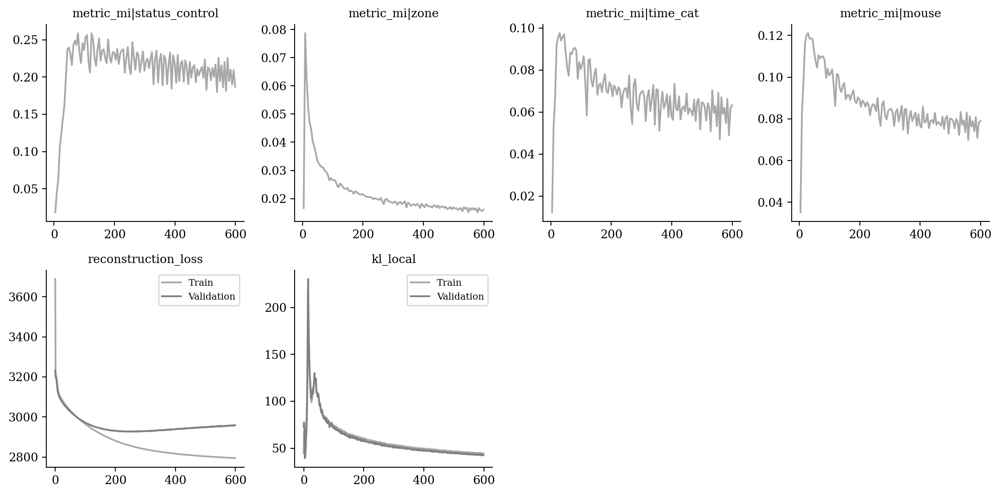

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

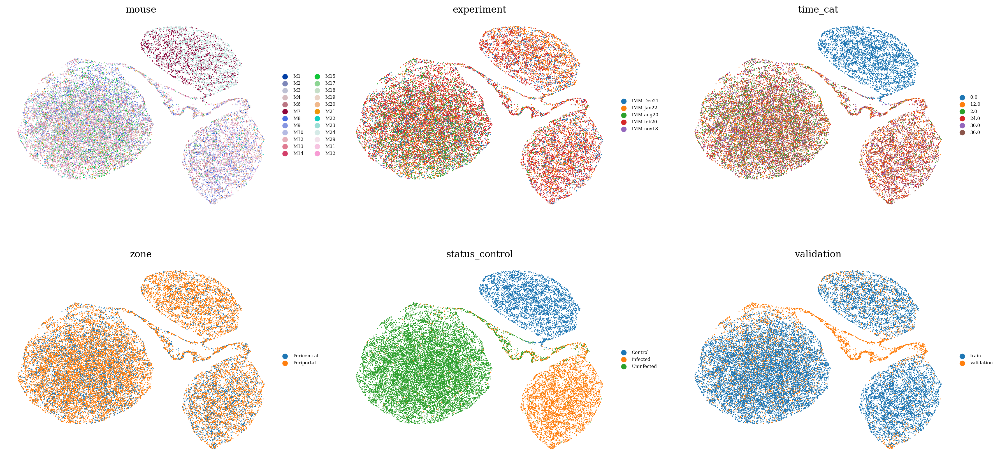

In [13]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

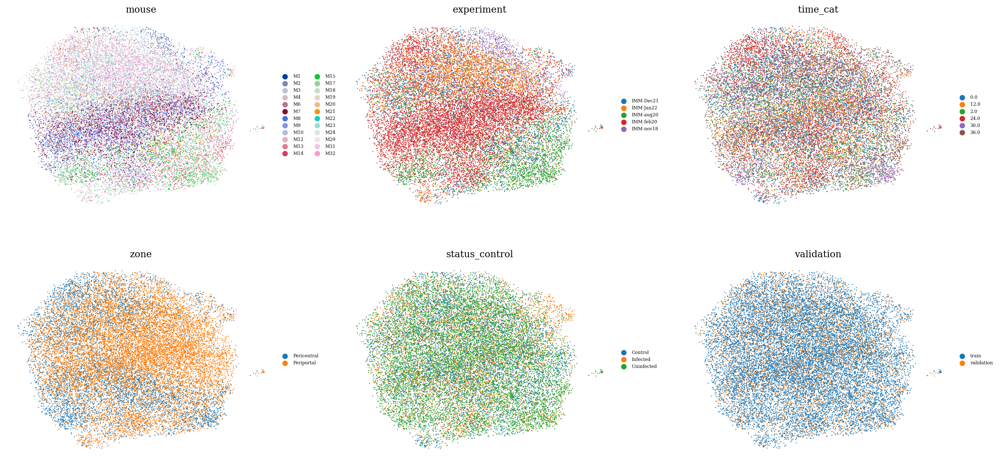

In [14]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [15]:
from tardis._utils.functions import label_transfer

In [16]:
k = "status_control"
sublatent = DM.configurations.get_by_obs_key(k).reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())

reference_embeddings = latent[vae.train_indices, :].copy()
query_embeddings = latent[vae.validation_indices, :].copy()

sc.pp.neighbors(reference_embeddings, n_neighbors=30)
label_transfer(reference_embeddings, query_embeddings, cluster_list=[k], neighbors_count=30)

predicted = query_embeddings.obs[f"transf_{k}"].astype(str).values
true = query_embeddings.obs[k].astype(str).values

import sklearn
metrics = {}
metrics['accuracy'] = sklearn.metrics.accuracy_score(true, predicted)
metrics['precision_macro'] = sklearn.metrics.precision_score(true, predicted, average='macro', zero_division=0)
metrics['recall_macro'] = sklearn.metrics.recall_score(true, predicted, average='macro', zero_division=0)
metrics['f1_score_macro'] = sklearn.metrics.f1_score(true, predicted, average='macro', zero_division=0)
metrics['precision_micro'] = sklearn.metrics.precision_score(true, predicted, average='micro', zero_division=0)
metrics['recall_micro'] = sklearn.metrics.recall_score(true, predicted, average='micro', zero_division=0)
metrics['f1_score_micro'] = sklearn.metrics.f1_score(true, predicted, average='micro', zero_division=0)
metrics['precision_weighted'] = sklearn.metrics.precision_score(true, predicted, average='weighted', zero_division=0)
metrics['recall_weighted'] = sklearn.metrics.recall_score(true, predicted, average='weighted', zero_division=0)
metrics['f1_score_weighted'] = sklearn.metrics.f1_score(true, predicted, average='weighted', zero_division=0)
metrics['confusion_matrix'] = sklearn.metrics.confusion_matrix(true, predicted)
metrics

{'accuracy': 0.8650918635170604,
 'precision_macro': 0.8612609916874039,
 'recall_macro': 0.8420356000649919,
 'f1_score_macro': 0.8500043698520781,
 'precision_micro': 0.8650918635170604,
 'recall_micro': 0.8650918635170604,
 'f1_score_micro': 0.8650918635170604,
 'precision_weighted': 0.860527485382887,
 'recall_weighted': 0.8650918635170604,
 'f1_score_weighted': 0.8615227763621269,
 'confusion_matrix': array([[ 621,    7,    5],
        [   3,  520,  306],
        [  14,  179, 2155]])}

In [17]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='most_frequent')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.6162729658792651


In [18]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier(strategy='stratified')
dummy_clf.fit(true.reshape(-1, 1), true)
dummy_predictions = dummy_clf.predict(true.reshape(-1, 1))
accuracy = sklearn.metrics.accuracy_score(true, dummy_predictions)
print(f"Baseline Accuracy: {accuracy}")

Baseline Accuracy: 0.4503937007874016


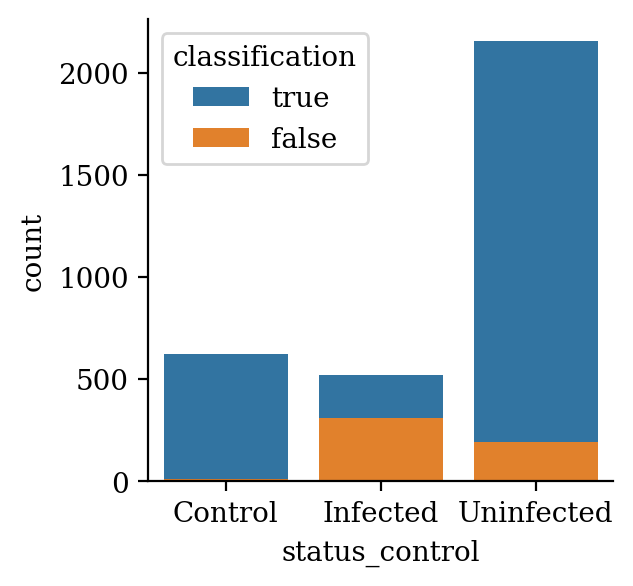

In [19]:
query_embeddings.obs["classification"] = 'false'
query_embeddings.obs.loc[query_embeddings.obs[k] == query_embeddings.obs[f"transf_{k}"], "classification"] = 'true'
grouped = query_embeddings.obs.groupby(k)['classification'].value_counts().rename('count').reset_index()

# Plotting the data
plt.figure(figsize=(3, 3))
# Create a barplot, which inherently supports stacking by using the 'hue' argument, and normalize the height by 'proportion'
sns.barplot(data=grouped, x=k, y='count', hue='classification', dodge=False)
sns.despine()
plt.show()